In [1]:
import utils as ut
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score,mean_squared_error
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

# SA STEP1

In [12]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
path='../../dvm-dos-tem/mads_calibration/results/'
params='sample_matrix_STP1-MD3.csv'
model='rsults_STP1-MD3.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [26]:
df_param

,cmax,cmax.1,cmax.2,cmax.3
0,5.616784,363.247266,1419.377317,1.291432
1,3.159748,94.886245,303.228195,1.768840
2,8.164372,281.311993,241.121108,1.953962
3,10.765399,113.912689,508.172086,0.550375
4,4.826361,219.409787,922.427905,0.742797
...,...,...,...,...
995,10.764510,314.261539,578.551160,0.626531
996,10.595196,356.386996,364.967916,1.026242
997,5.199794,336.224132,345.364791,0.599846
998,9.866175,59.530917,1022.779356,1.012052


In [27]:
df_model

,0,1,2,3
0,1.464479,112.104530,1388.279644,0.962620
1,0.818066,29.687531,262.470441,1.313684
2,2.134833,86.333321,210.398090,1.464540
3,2.795366,33.375881,439.170642,0.401113
4,1.236244,64.024106,879.823759,0.539894
...,...,...,...,...
996,2.753972,109.333246,315.420277,0.754667
997,1.345594,103.041133,298.945751,0.438677
998,2.540545,17.280731,984.211058,0.739310
999,1.333296,51.349628,1051.732923,0.372787


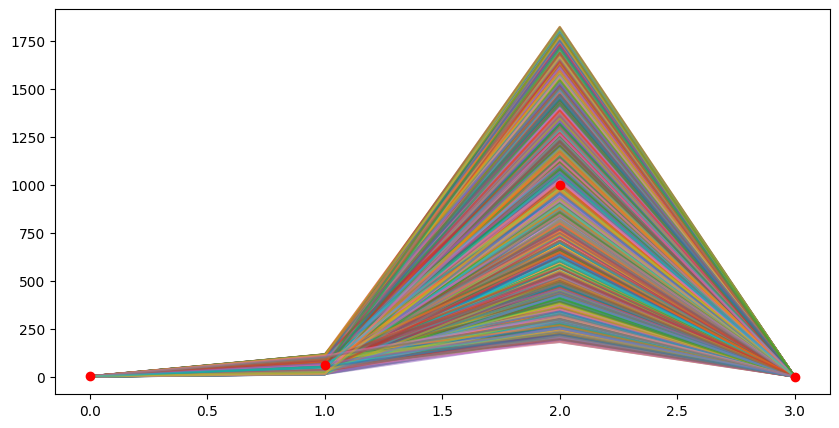

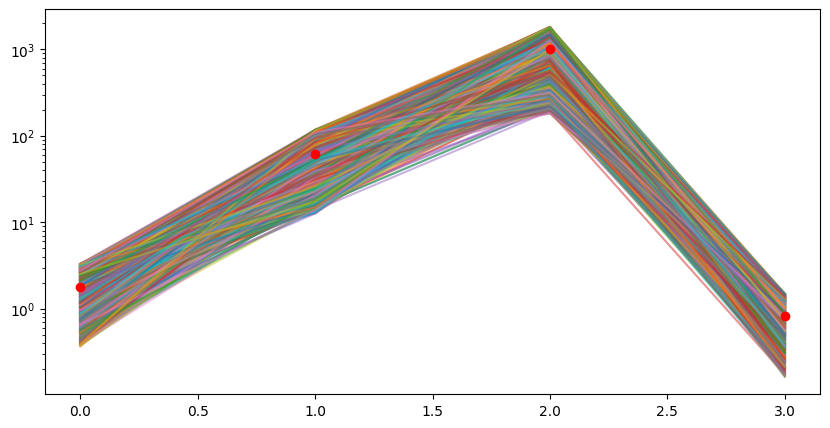

In [28]:
targets='GPP'
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

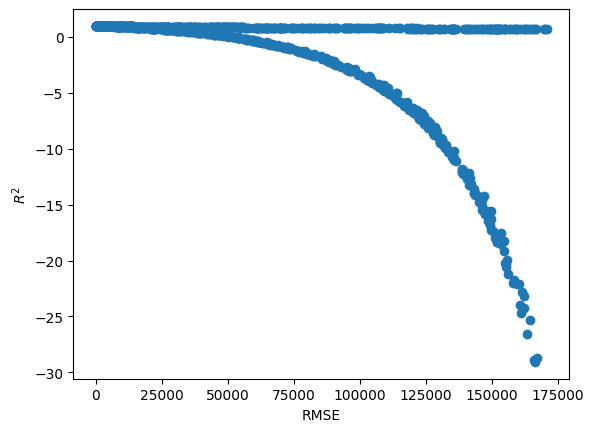

In [29]:
ut.plot_r2_rmse(df_model)

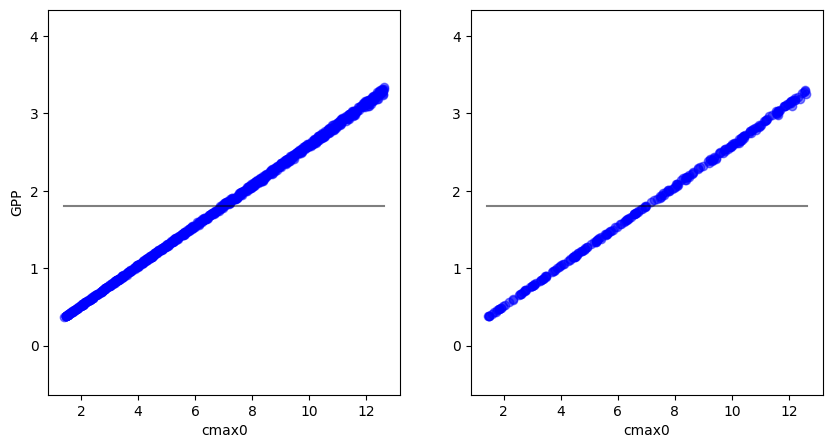

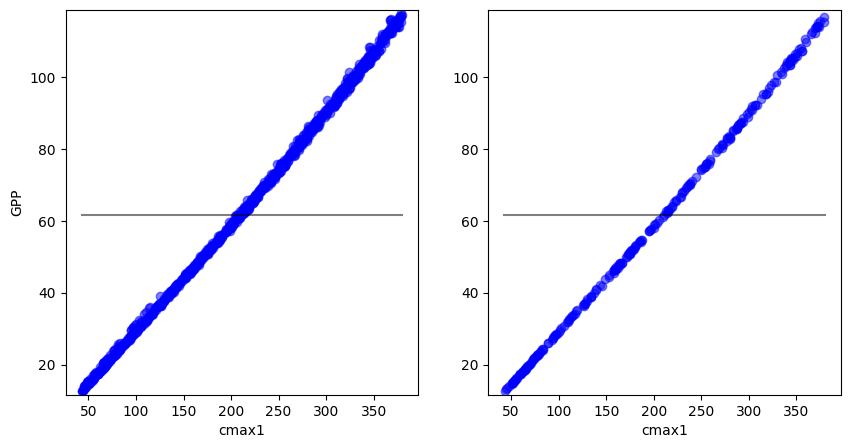

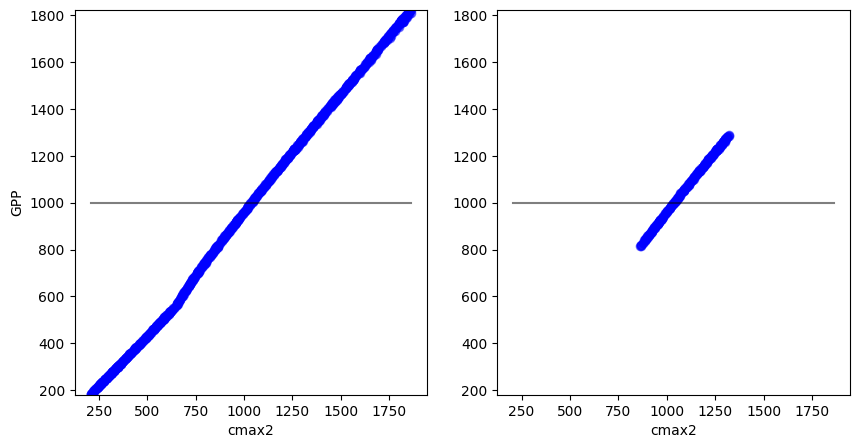

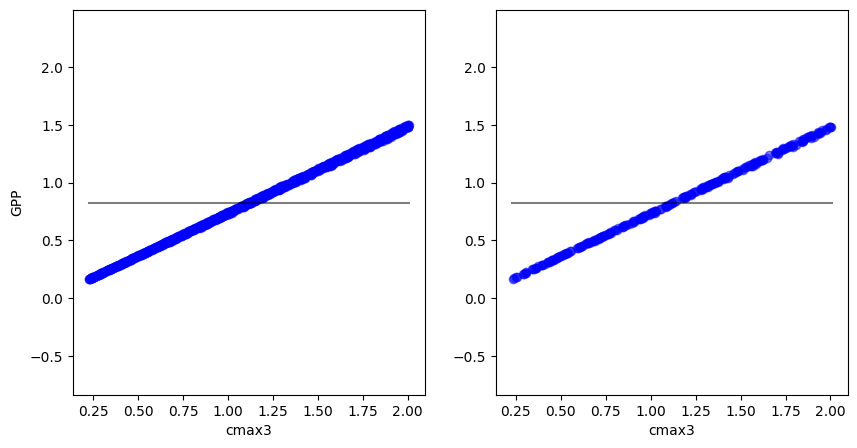

In [30]:
# dfp=df_param.drop(df_param.iloc[0,:].name) # try dropping param name row
# obs=results. iloc[:-1,:]
# tar=results. iloc[-1:,:]

for i in range(4):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='cmax'+str(i),ylabel='GPP')

In [17]:
# !pip install seaborn
import seaborn as sns


#visualize the correlation of a sample matrix
nparams=4
corr=df_param.corr()
selected_corr = corr.iloc[0:nparams,nparams:]
if not selected_corr.empty:
    plt.figure(figsize=(10,5))
    sns.heatmap(selected_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True))
    plt.title('Correlation Matrix [Parameters/results]',fontsize=16)
    plt.ylabel('Parameters',fontsize=16)
    plt.xlabel('Outputs',fontsize=16)
else:
    print("Selected correlation matrix is empty!")


Selected correlation matrix is empty!


In [18]:
corr

,cmax,cmax.1,cmax.2,cmax.3
cmax,1.000000,-0.024195,0.002855,-0.019292
cmax.1,-0.024195,1.000000,0.001442,-0.003933
cmax.2,0.002855,0.001442,1.000000,0.019896
cmax.3,-0.019292,-0.003933,0.019896,1.000000


In [19]:
corr_model=df_model.corr()
corr_model

,0,1,2,3
0,1.000000,-0.023580,0.010804,-0.020322
1,-0.023580,1.000000,0.003157,-0.004306
2,0.010804,0.003157,1.000000,0.025533
3,-0.020322,-0.004306,0.025533,1.000000


# SA STEP 2

In [2]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
params='sample_matrix_STEP2-MD3-CR-noprior.csv'
model='results_STEP2-MD3-CR-noprior.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

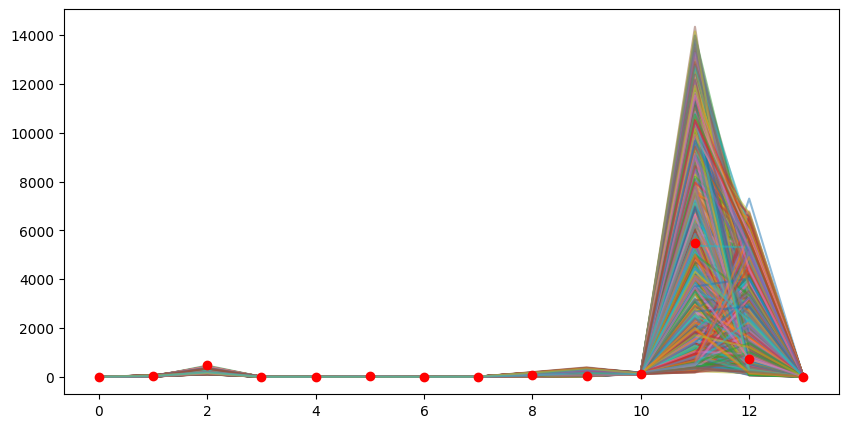

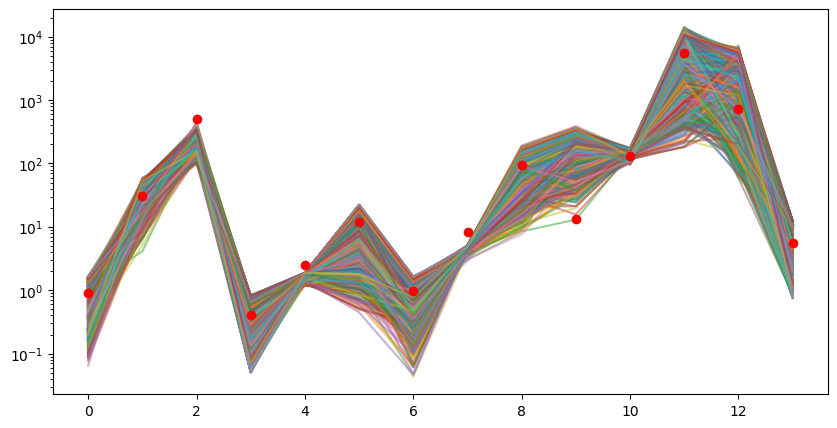

In [32]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

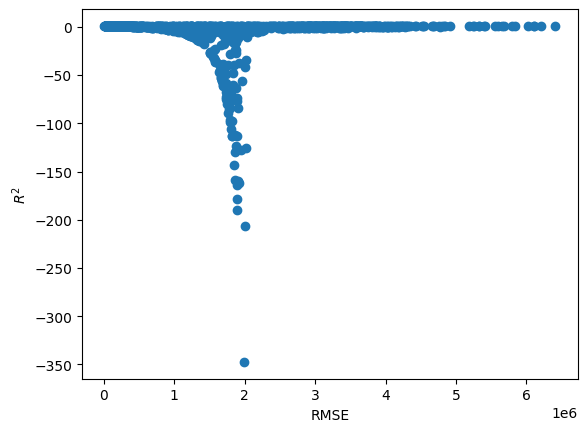

In [33]:
ut.plot_r2_rmse(df_model)

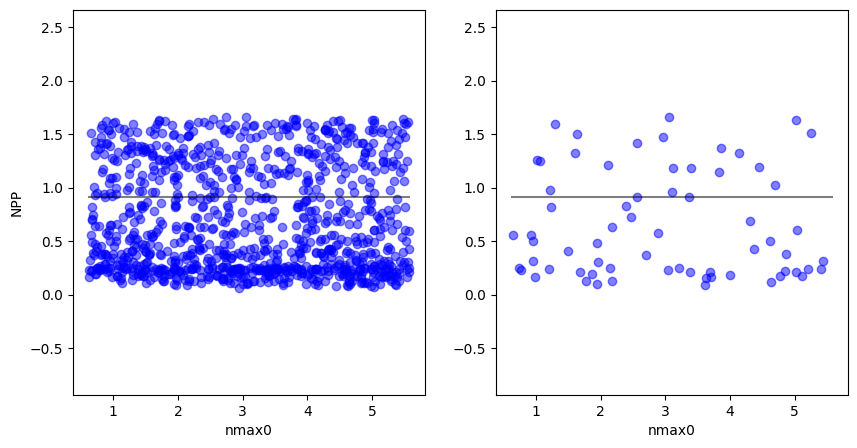

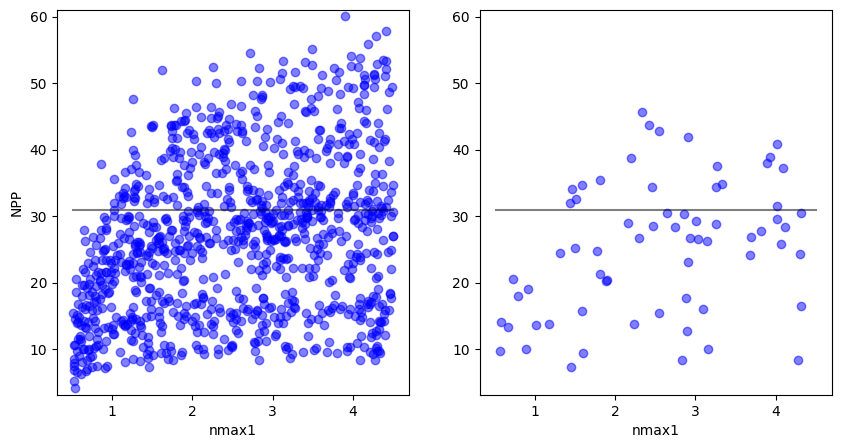

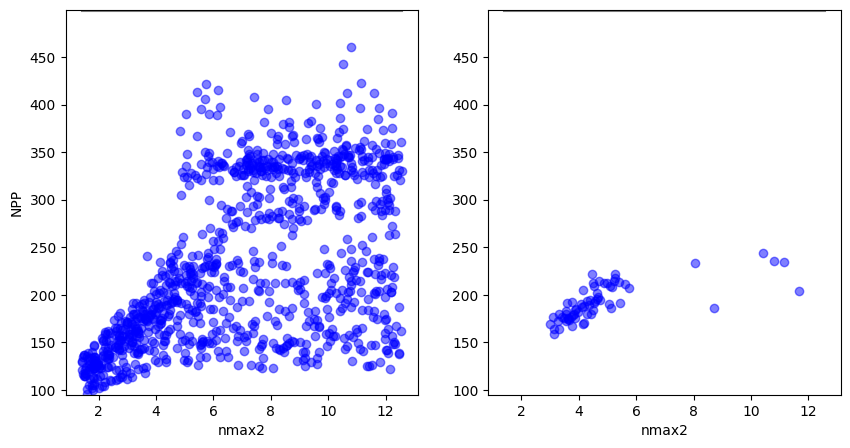

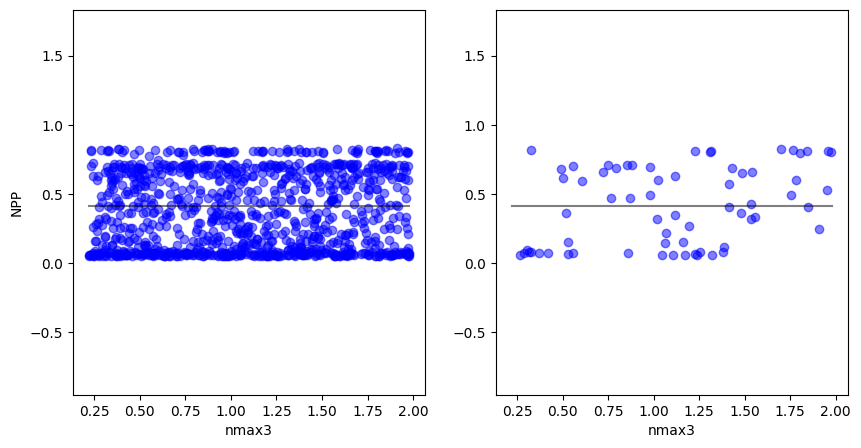

In [34]:
for i in range(4):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='nmax'+str(i),ylabel='NPP')

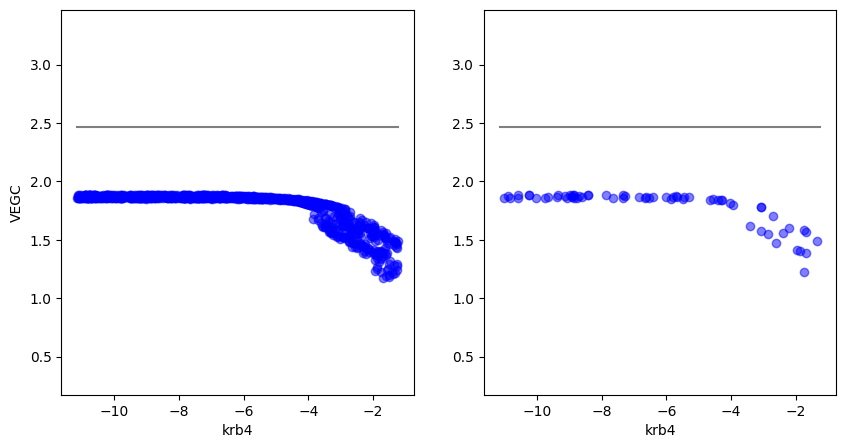

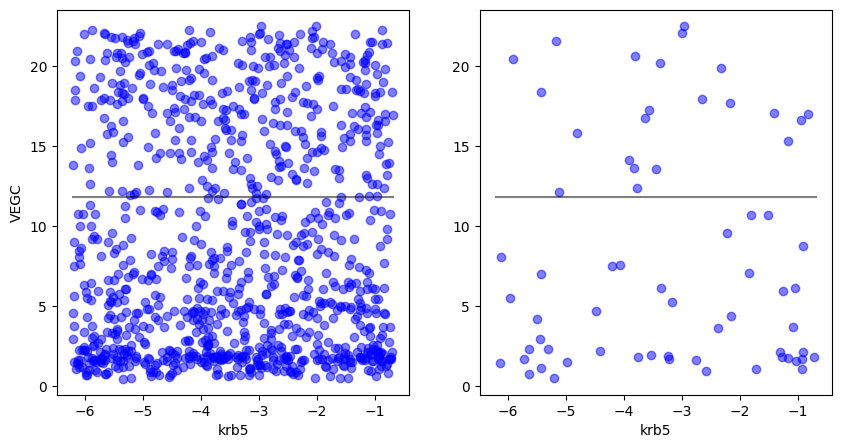

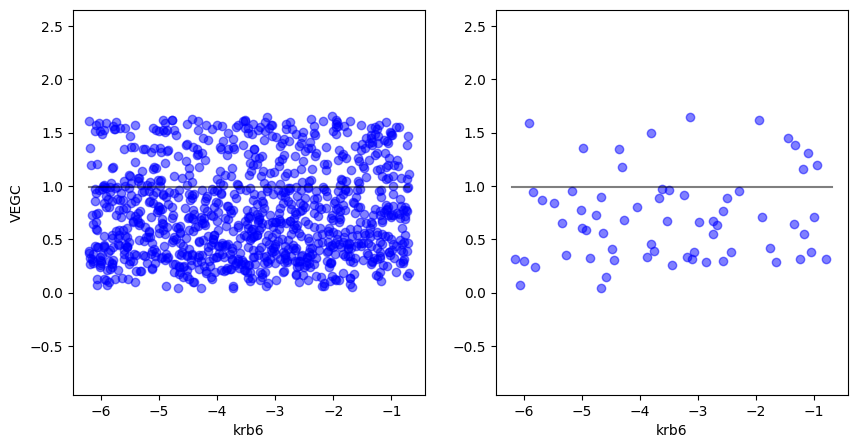

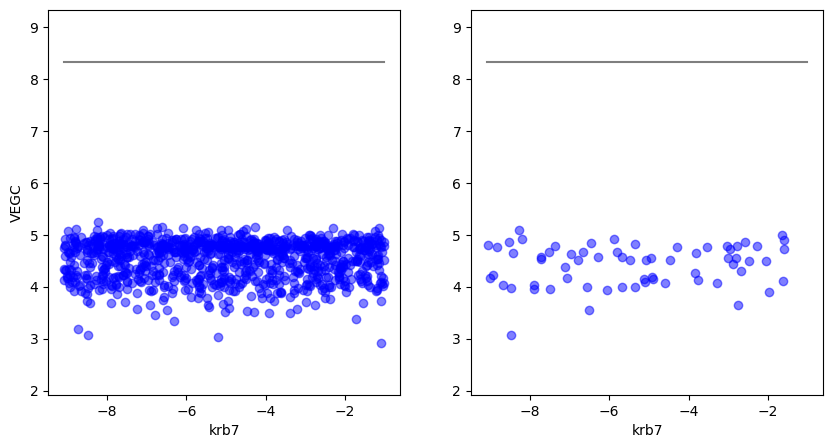

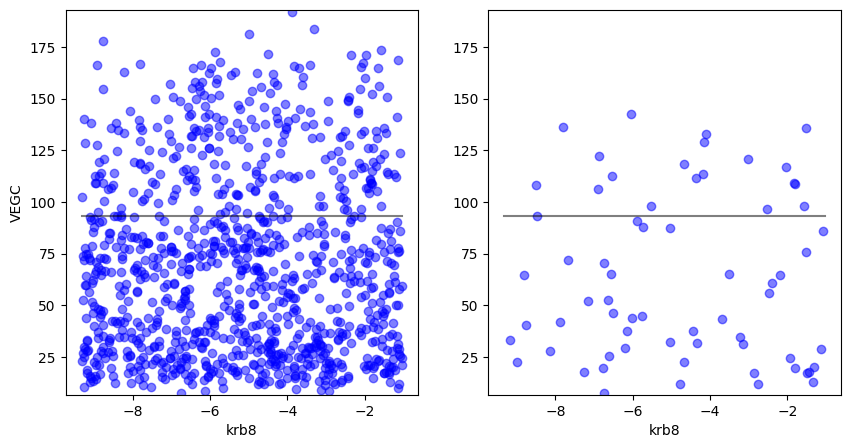

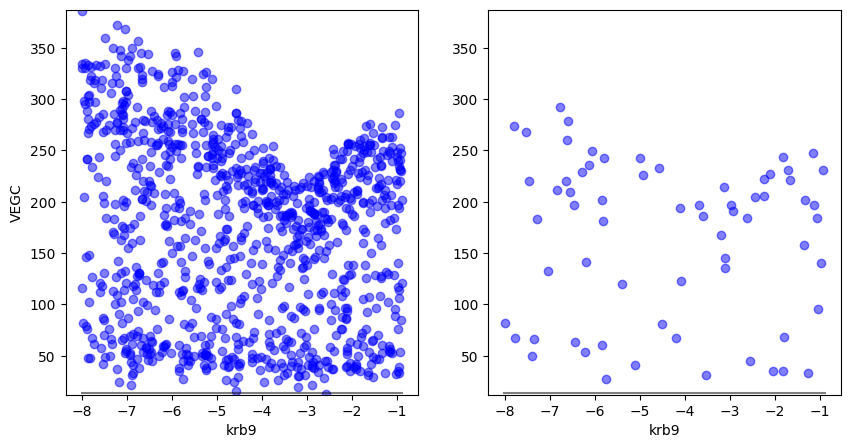

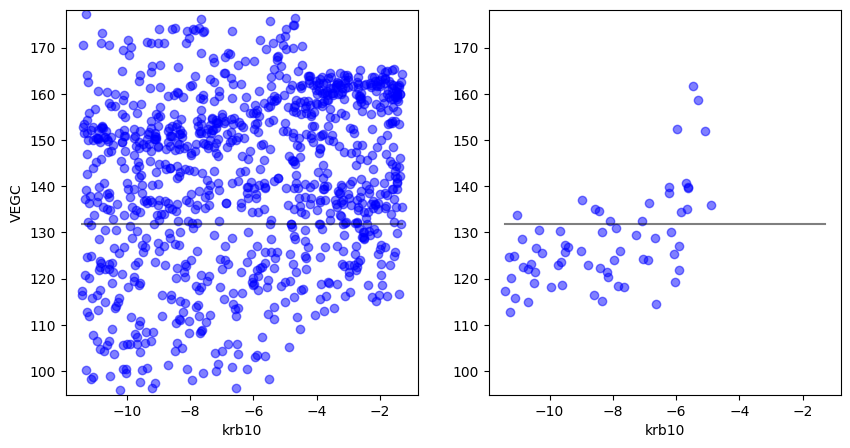

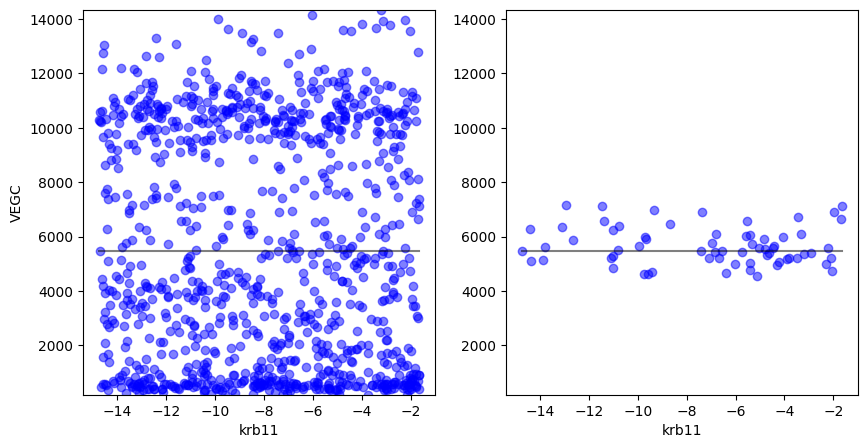

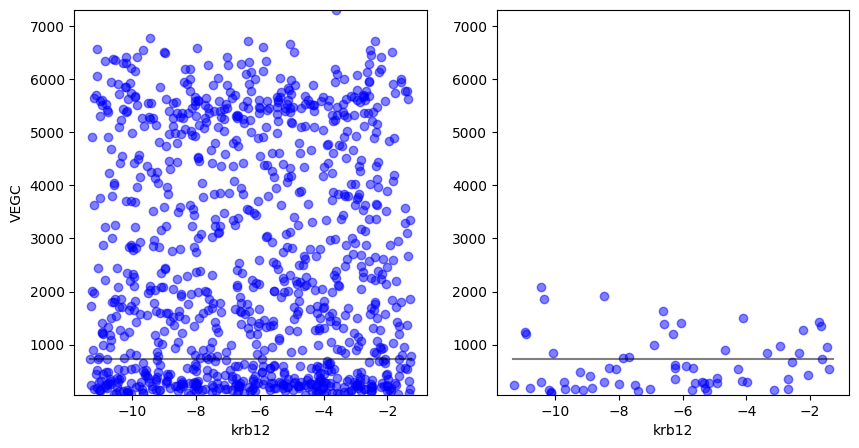

In [35]:
for i in range(4,13):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='krb'+str(i),ylabel='VEGC')

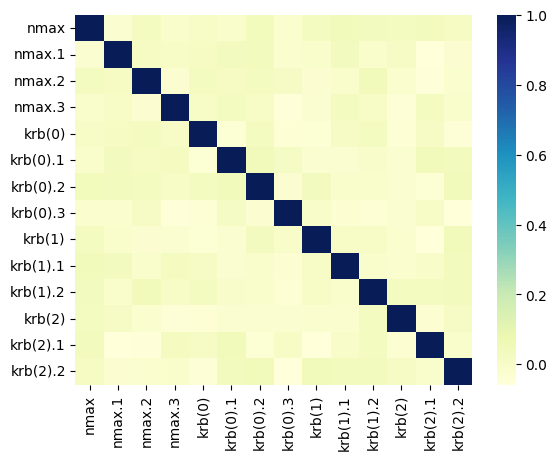

In [4]:
corr_param=df_param.corr()
high_corr = corr_param[corr_param > 0.4]

sns.heatmap(corr_param, cmap="YlGnBu")
plt.show()

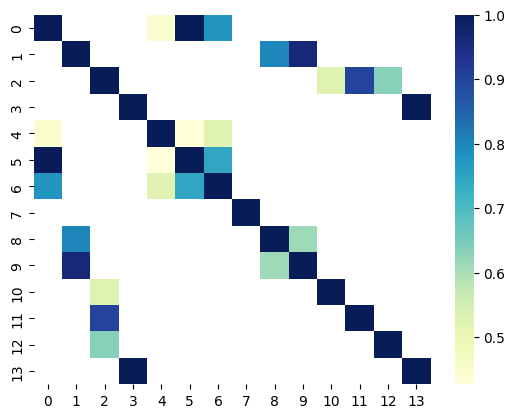

In [5]:
corr_model=df_model.corr()
high_corr = corr_model[corr_model > 0.4]

sns.heatmap(high_corr, cmap="YlGnBu")
plt.show()

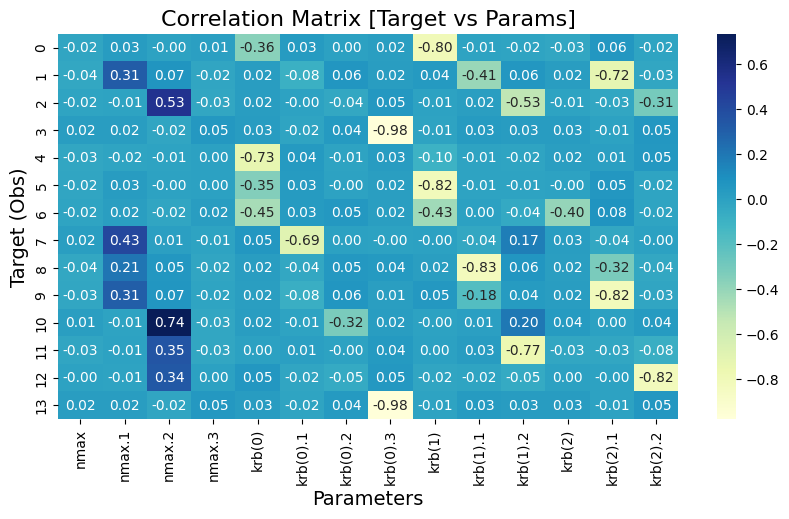

In [3]:
corr_mp=ut.get_output_param_corr(df_param,df_model)

In [8]:
#From Chat Gpt, doesn't work. want to plot all scatter plots for model-param corr > threshold
corr_thresh = 0.65
corr_mask = corr_mp > corr_thresh

fig, axs = plt()

ax_idx = 0
for model_col in corr_mask.index:
    for param_col in corr_mask.columns:
        if corr_mask.loc[model_col, param_col]:
            axs[ax_idx].scatter(df_param[param_col], df_model[model_col])
            axs[ax_idx].set_xlabel(param_col)
            axs[ax_idx].set_ylabel(model_col)
            ax_idx += 1

plt.show()


NameError: name 'corr_mp' is not defined

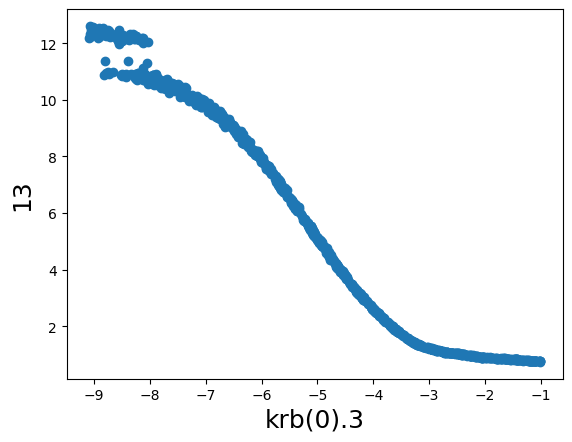

In [46]:
plt.scatter( df_param['krb(0).3'],df_model.iloc[:-1,13])
plt.xlabel('krb(0).3',fontsize=18)
plt.ylabel('13',fontsize=18);

(-0.2534432232379913, 13.60780448913574)

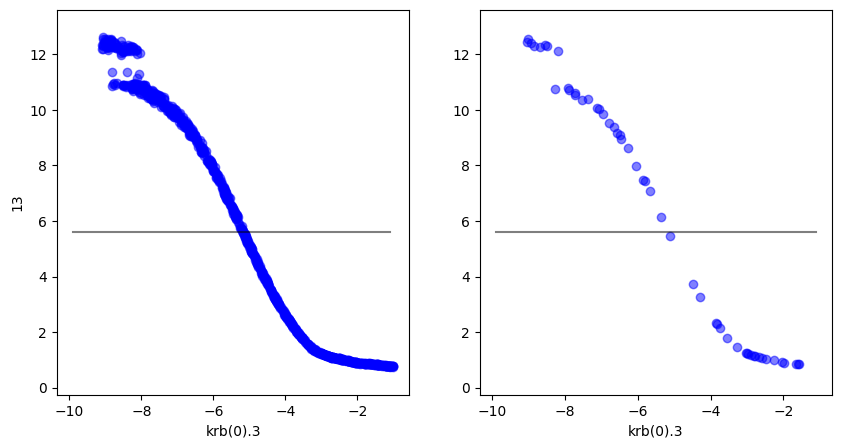

In [7]:
x=df_param
y=df_model

tight_params, tight_model = ut.get_params(x,y,r2lim=0.95)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))

ax1.plot(x['krb(0).3'],y.iloc[:-1,13],'o',alpha=0.5,color='b')
ax1.set_xlabel('krb(0).3')
ax1.set_ylabel('13')
ax1.set_ylim([min(y.iloc[:,13])-1, max(y.iloc[:,13]+1)])
x1=min(x.iloc[:,13])
x2=max(x.iloc[:,13])
ax1.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,13],alpha=0.5,color='black')

ax2.plot(tight_params['krb(0).3'],tight_model.iloc[:,13],'o',alpha=0.5,color='b')
ax2.set_xlabel('krb(0).3')
ax2.plot(np.linspace(x1,x2,10),np.ones(10)*y.iloc[-1,13],alpha=0.5,color='black')
ax2.set_ylim([min(y.iloc[:,13])-1, max(y.iloc[:,13])+1])

## prior guided (AC3)

In [36]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
params='sample_matrix_AC3-STEP2-MD3-CR.csv'
model='results_AC3-STEP2-MD3-CR.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

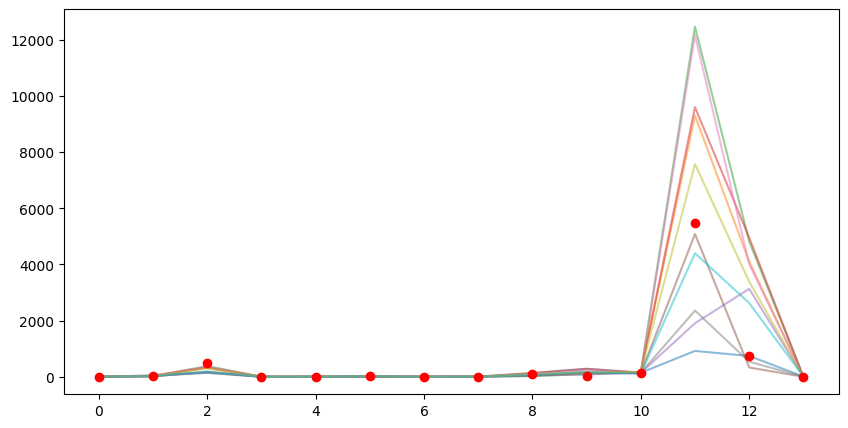

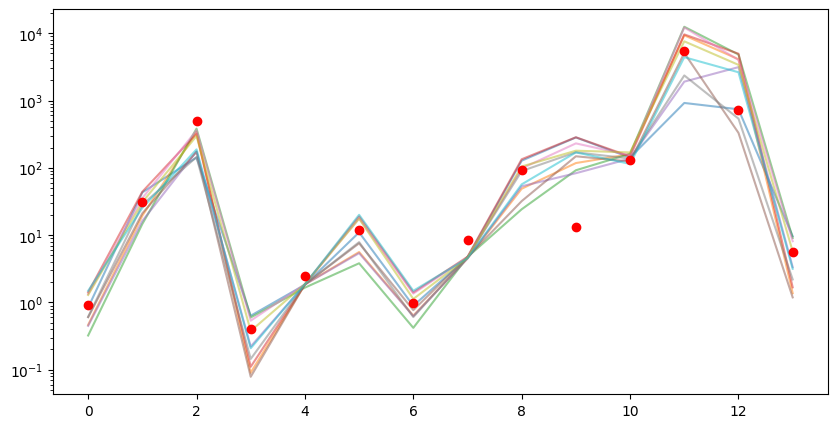

In [ ]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

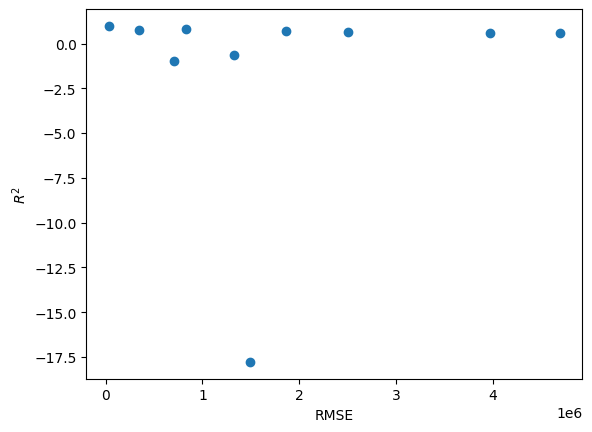

In [ ]:
ut.plot_r2_rmse(df_model)

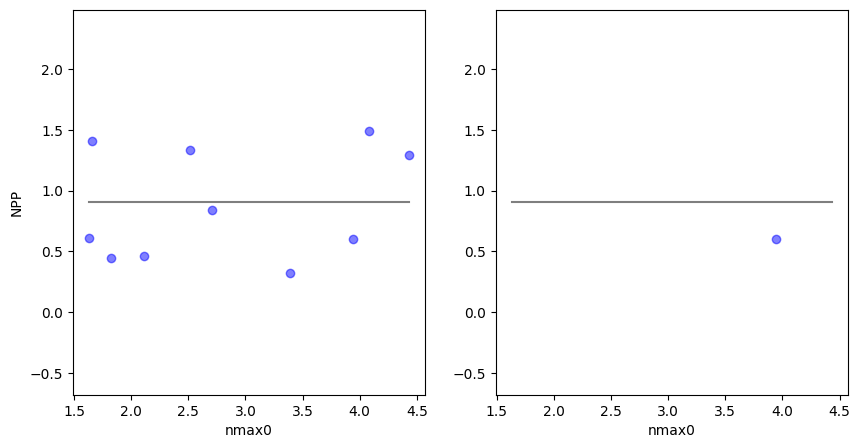

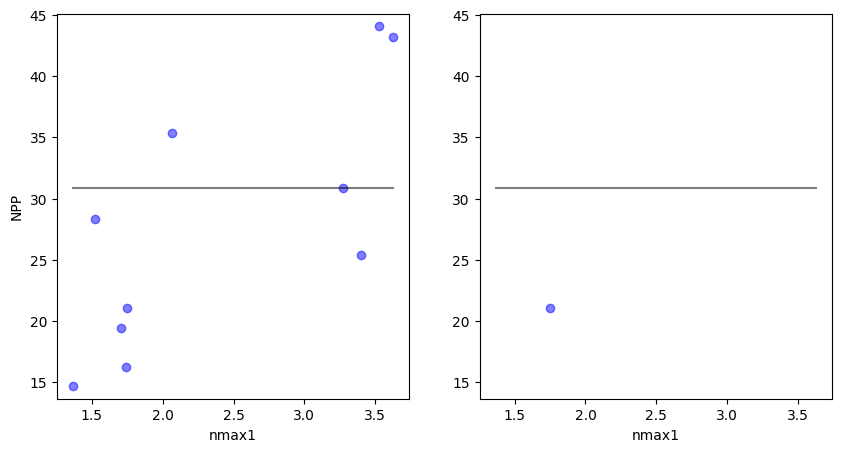

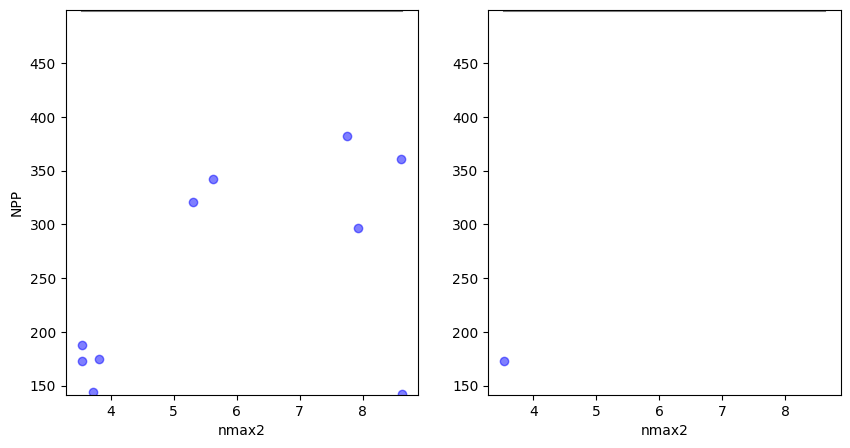

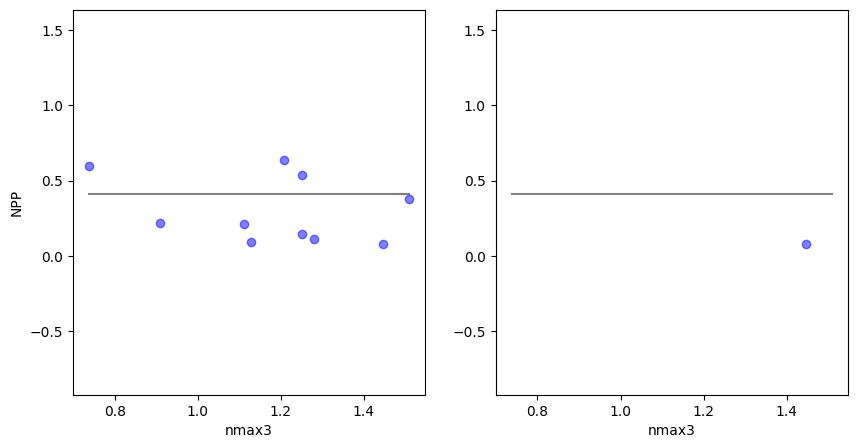

In [ ]:
for i in range(4):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='nmax'+str(i),ylabel='NPP')

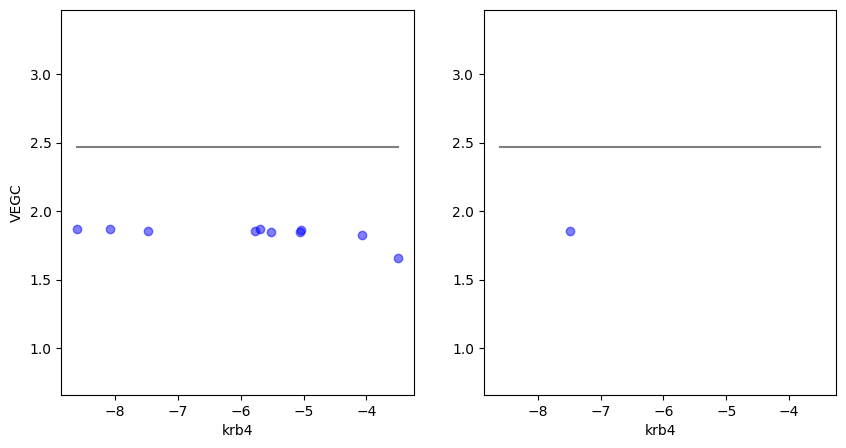

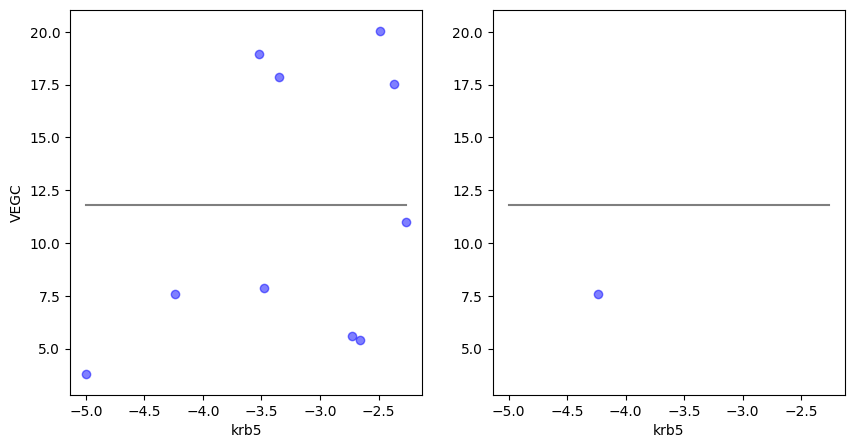

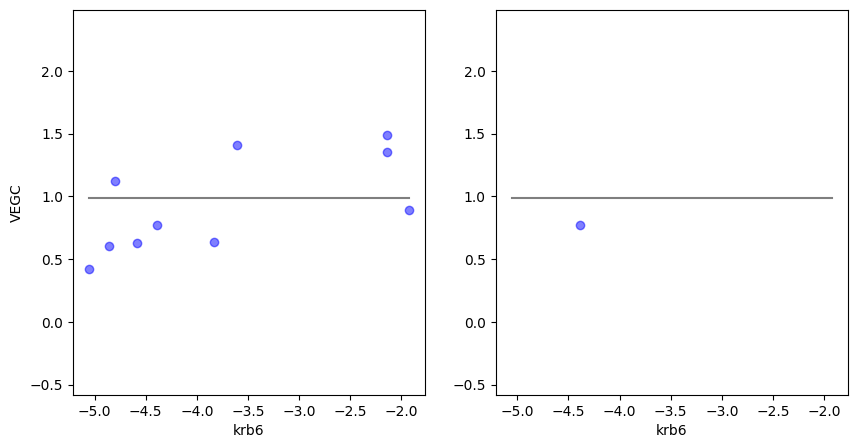

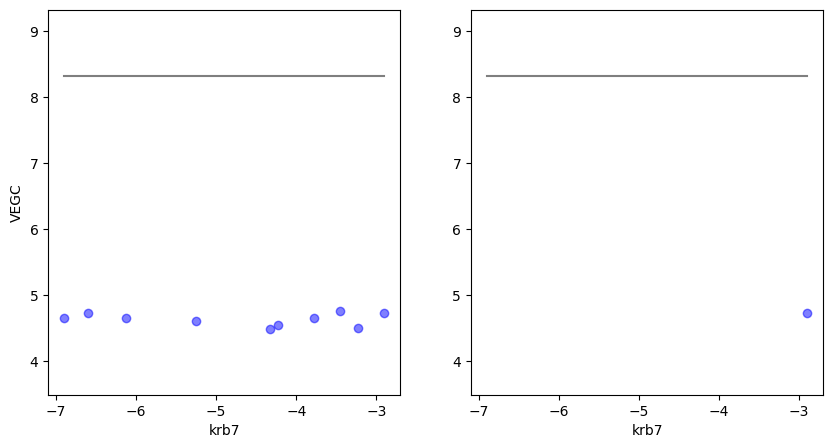

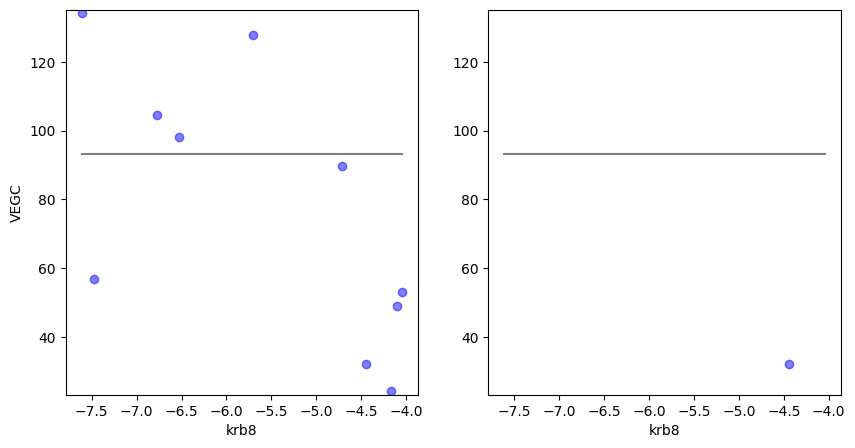

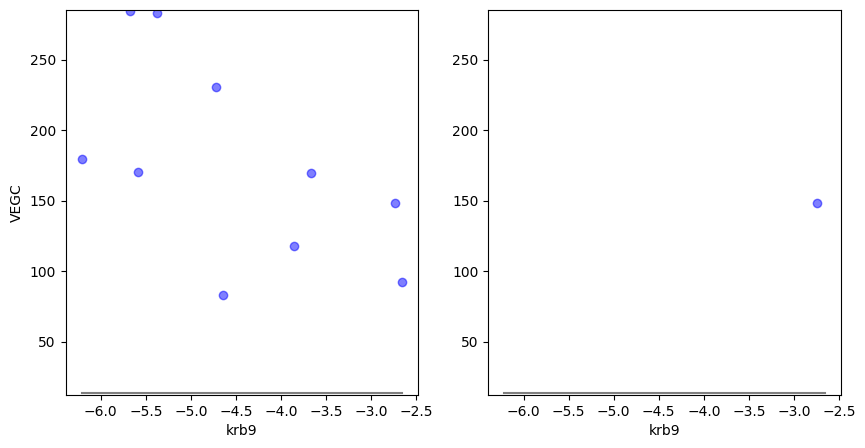

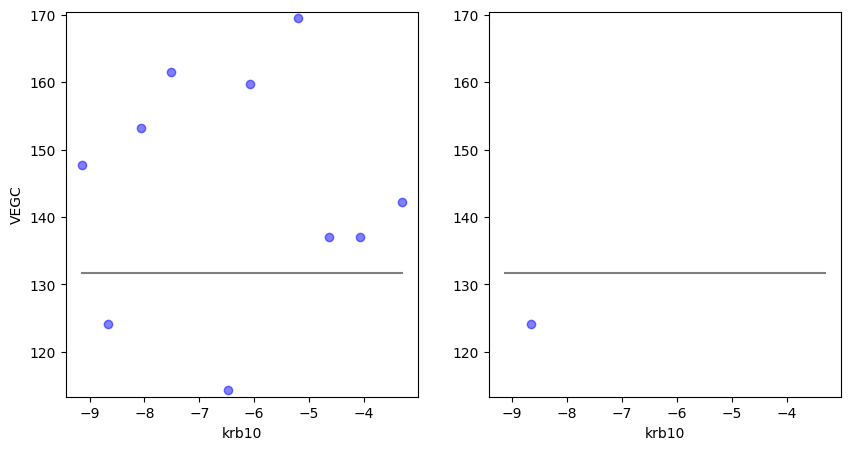

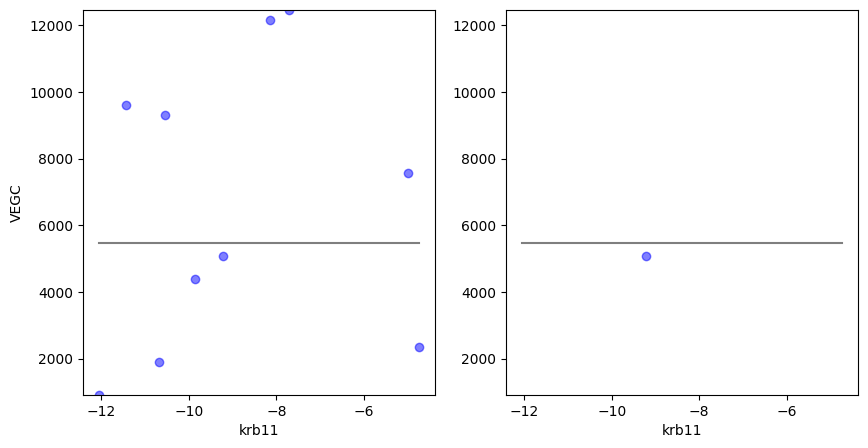

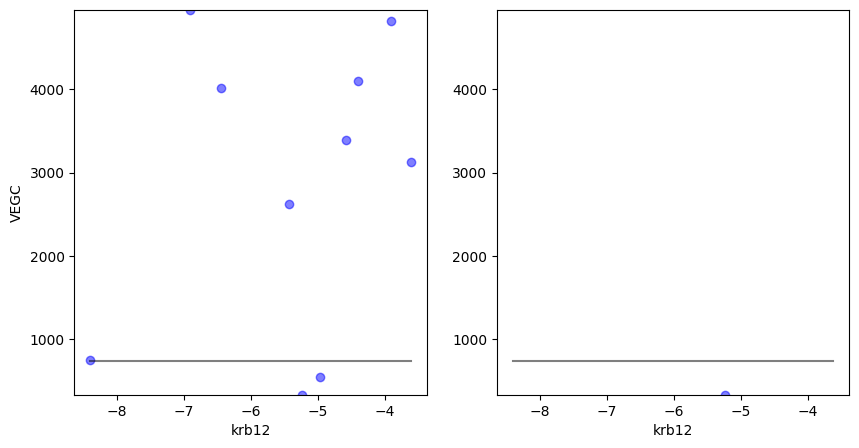

In [ ]:
for i in range(4,13):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='krb'+str(i),ylabel='VEGC')

# SA STEP 3

In [2]:
path_SA='../../dvm-dos-tem/mads_calibration/SA/'
params='sample_matrix_STEP3-MD3-CR.csv'
model='results_STEP3-MD3-CR.txt'
df_param = pd.read_csv(path_SA+params)
df_model = pd.read_csv(path_SA+model,header=None)

In [ ]:
df_param

,nmax,nmax.1,nmax.2,nmax.3,krb(0),krb(0).1,krb(0).2,krb(0).3,krb(1),krb(1).1,...,cfall(2).2,nfall(0),nfall(0).1,nfall(0).2,nfall(1),nfall(1).1,nfall(1).2,nfall(2),nfall(2).1,nfall(2).2
0,2.477719,4.302857,9.598332,1.273639,-2.787705,-1.551090,-1.010622,-8.008703,-6.018041,-5.931477,...,0.000943,0.010227,0.040776,0.004156,0.001023,0.001148,0.002195,0.012893,0.003783,0.002433
1,5.326472,4.362528,10.454050,0.756120,-2.208907,-4.466966,-3.119642,-1.996069,-5.140026,-1.134846,...,0.000410,0.005649,0.007626,0.005764,0.000822,0.000634,0.012208,0.008479,0.005196,0.008547
2,1.318984,3.708788,2.234967,1.956921,-8.900668,-1.786911,-0.720482,-7.598928,-6.894434,-6.080531,...,0.001147,0.004305,0.037553,0.011338,0.001098,0.001434,0.007921,0.011400,0.007073,0.001925
3,1.155141,0.625717,8.527797,0.773267,-6.285021,-5.699767,-2.066093,-4.325894,-7.298008,-2.519043,...,0.000851,0.004137,0.015811,0.007067,0.001509,0.001577,0.001689,0.011189,0.006943,0.004443
4,1.214532,1.850461,11.960589,0.788837,-6.386403,-4.570665,-2.697235,-8.861999,-9.012763,-2.682690,...,0.000705,0.014030,0.039721,0.004642,0.001365,0.000788,0.009694,0.013350,0.008458,0.002756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3.324313,1.893651,9.271301,0.253106,-7.891095,-1.257995,-1.047518,-6.864956,-6.343156,-7.261944,...,0.000676,0.012056,0.045075,0.007561,0.001009,0.000415,0.006982,0.009011,0.006102,0.012957
996,0.914135,4.388589,1.492364,1.884245,-6.676631,-4.567498,-1.722973,-6.296029,-8.345665,-1.883099,...,0.000852,0.018558,0.038864,0.003313,0.000962,0.000709,0.014118,0.019413,0.005690,0.006107
997,3.593094,2.417228,3.786730,1.382325,-4.554556,-4.298515,-2.807922,-6.667696,-6.570722,-4.512747,...,0.000531,0.010267,0.045259,0.004011,0.001110,0.001739,0.009755,0.009943,0.010770,0.012155
998,3.548961,3.987329,7.163428,1.680851,-10.684031,-3.456864,-4.029609,-5.934498,-7.512532,-6.749517,...,0.001428,0.002529,0.038030,0.011498,0.001357,0.001425,0.007116,0.019690,0.011466,0.009007


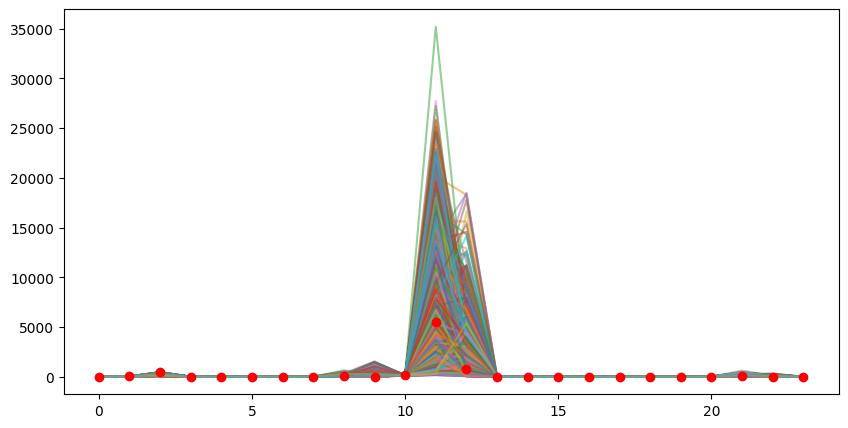

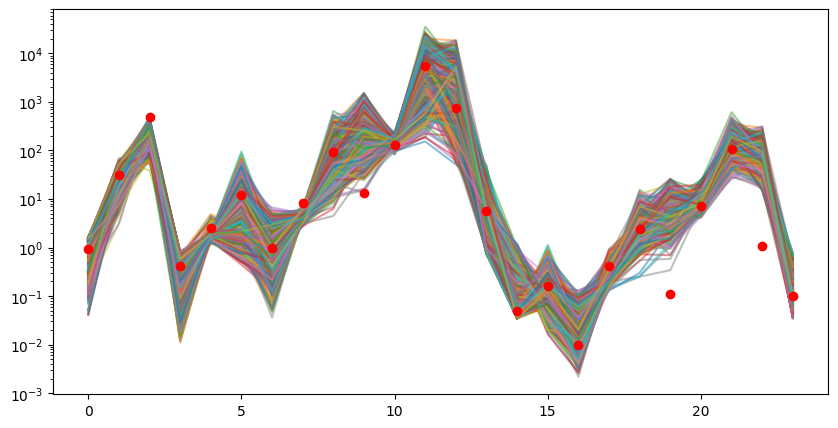

In [ ]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

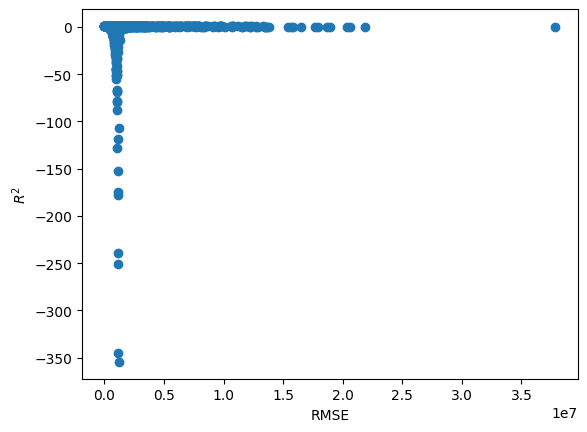

In [ ]:
ut.plot_r2_rmse(df_model)

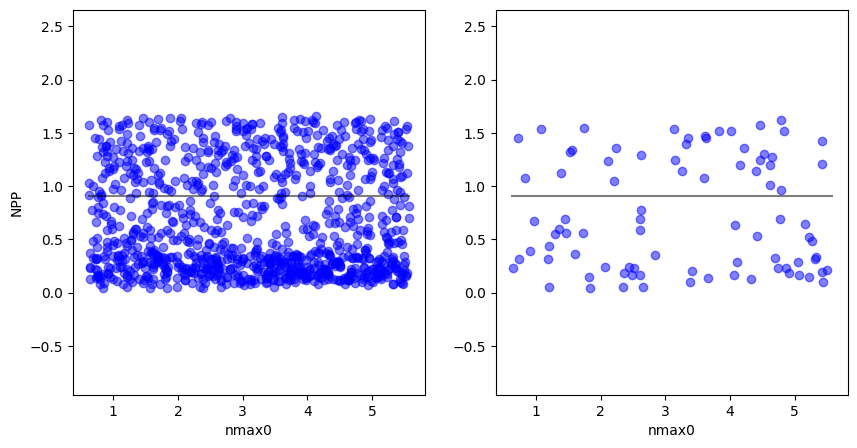

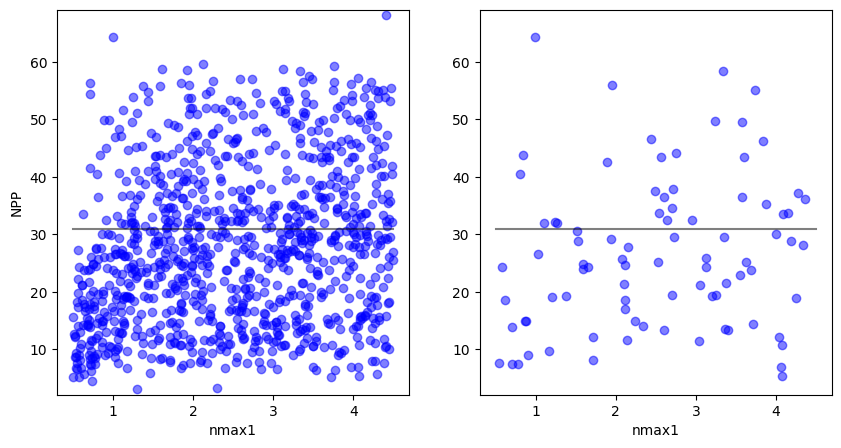

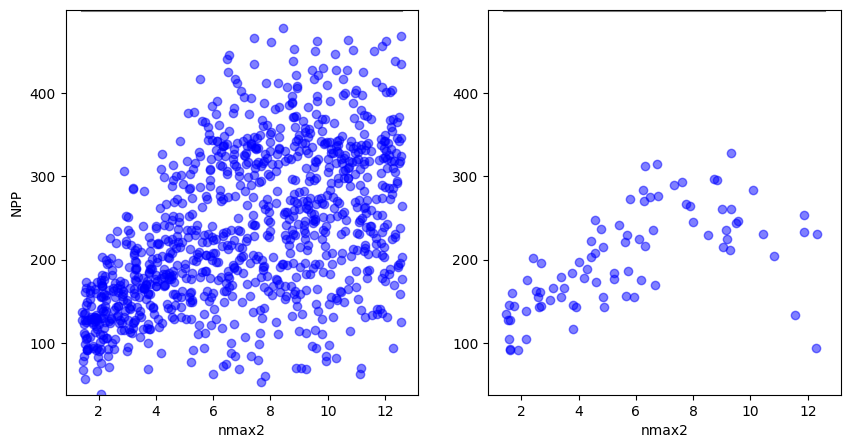

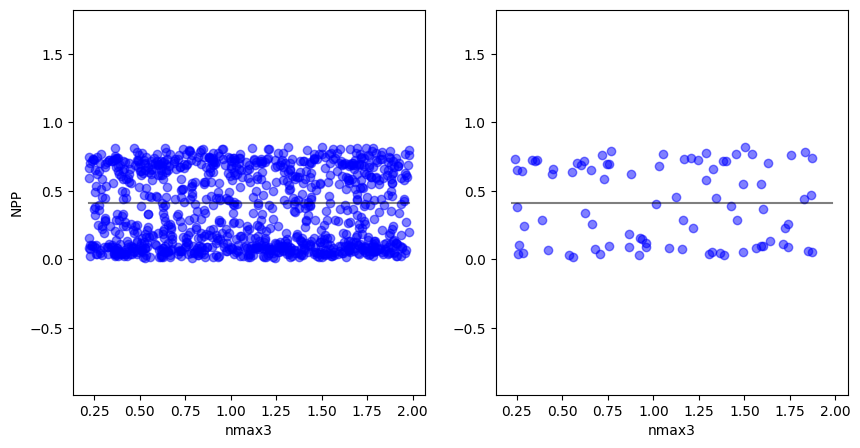

In [3]:
for i in range(4):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='nmax'+str(i),ylabel='NPP')

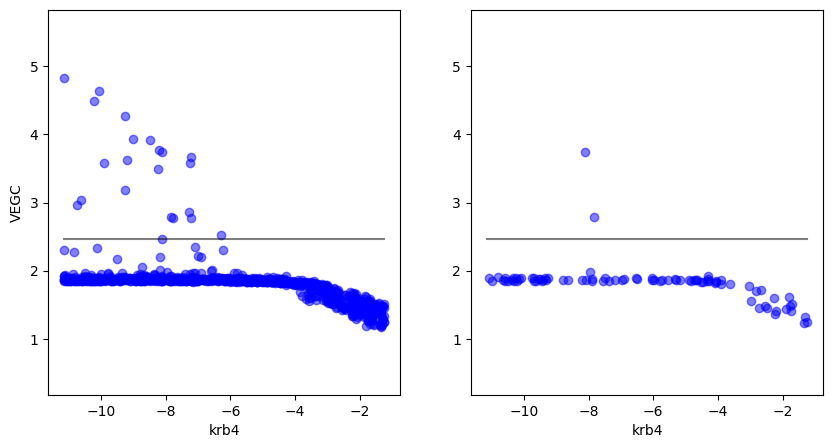

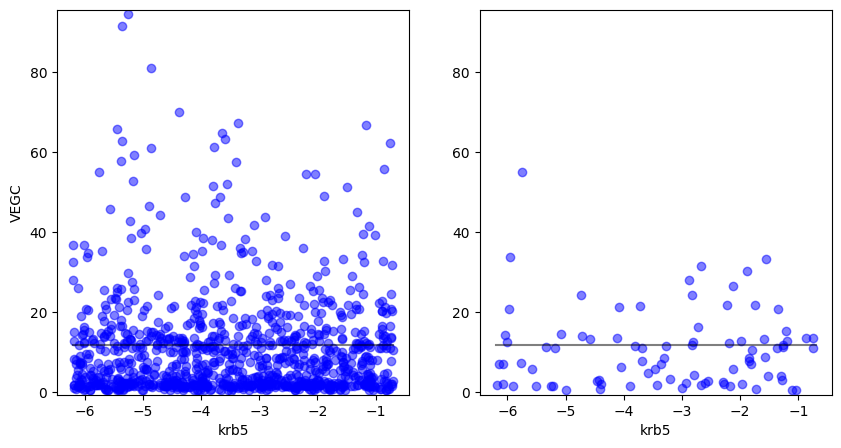

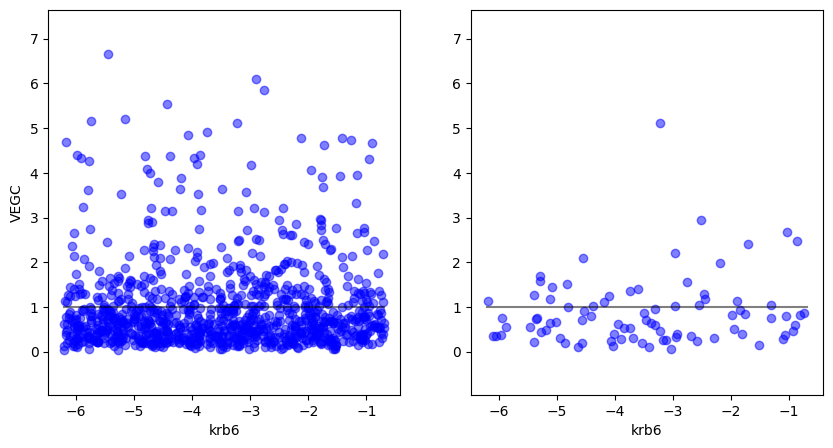

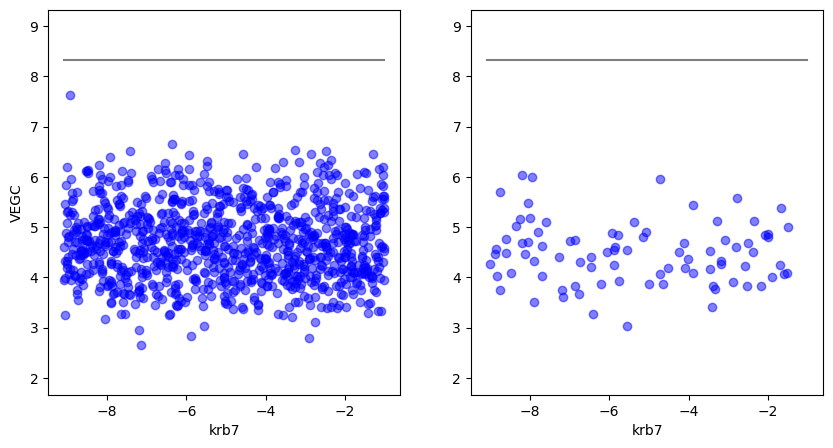

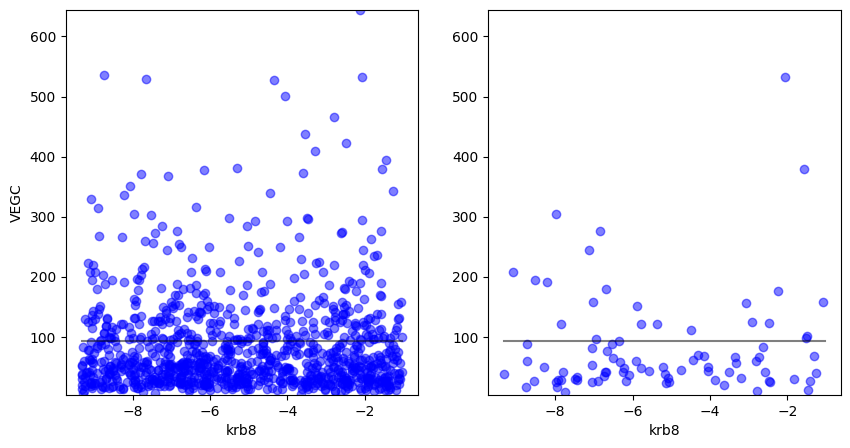

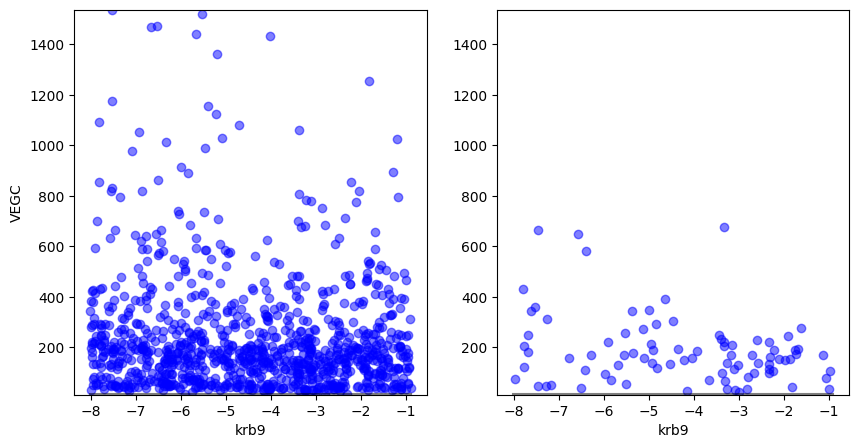

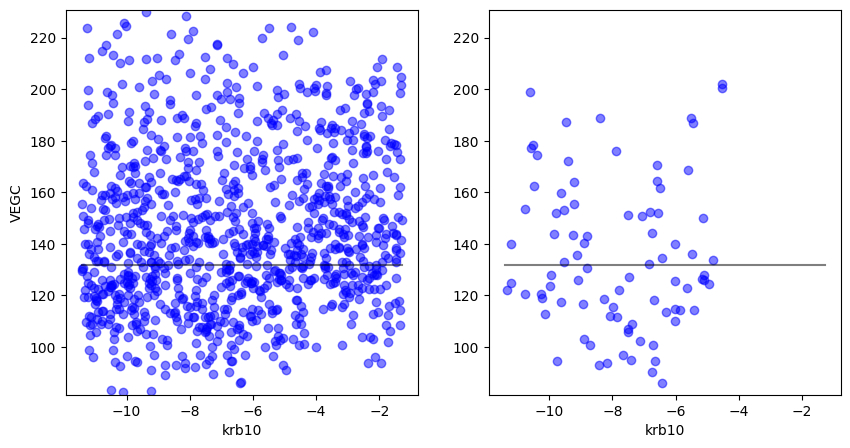

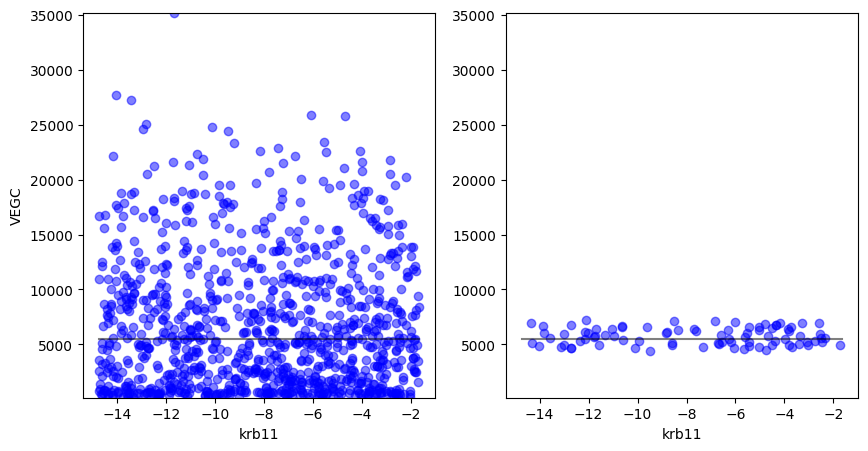

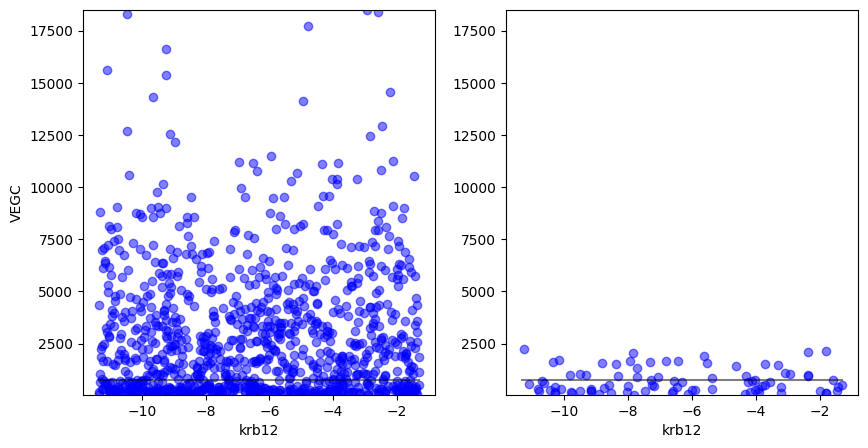

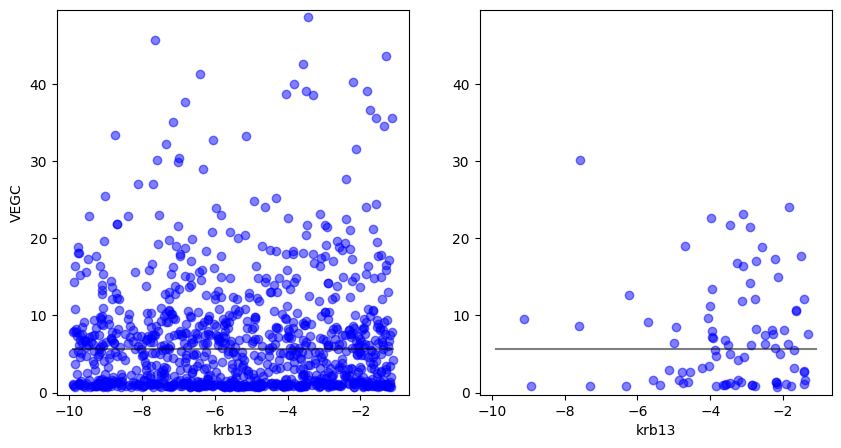

In [4]:
for i in range(4,14):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='krb'+str(i),ylabel='VEGC')

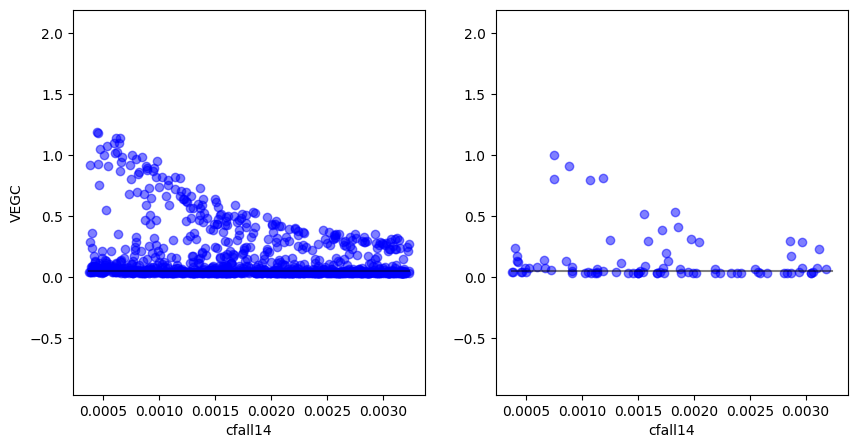

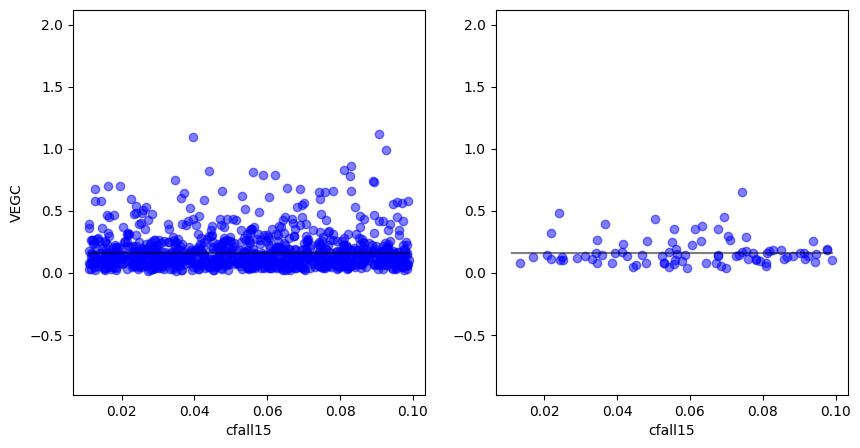

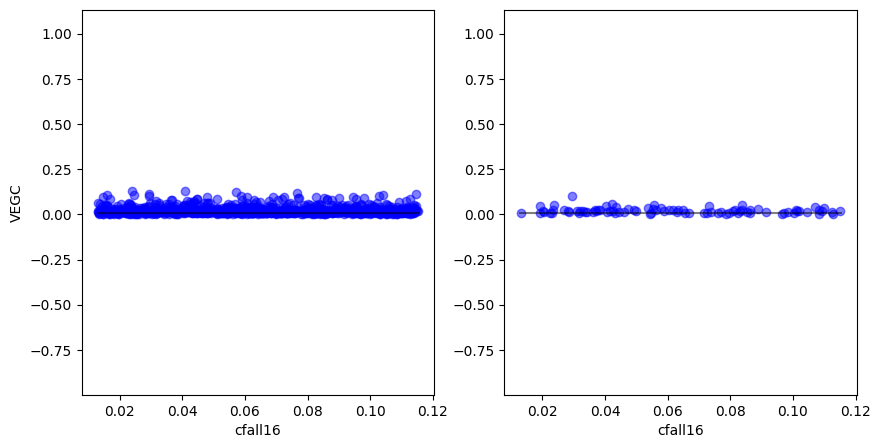

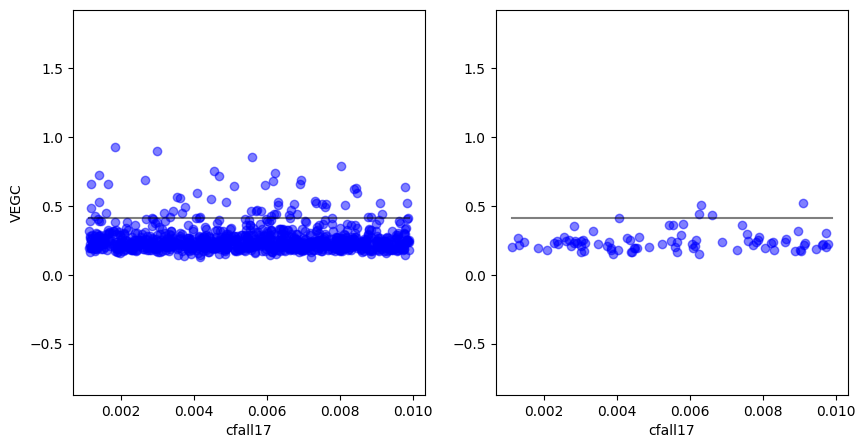

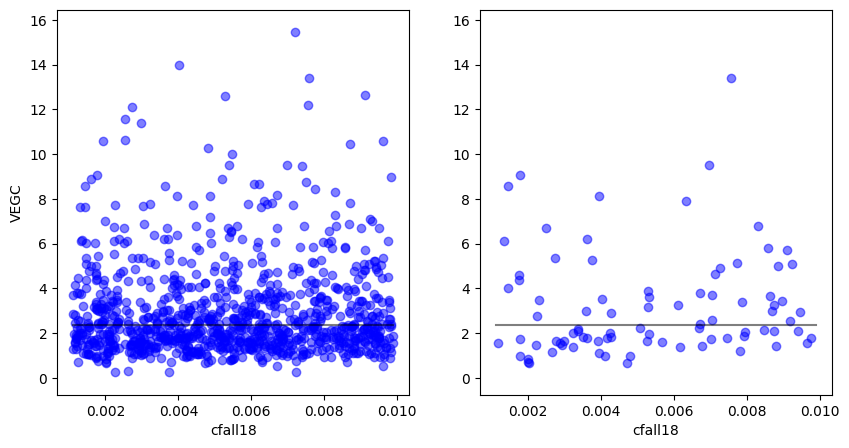

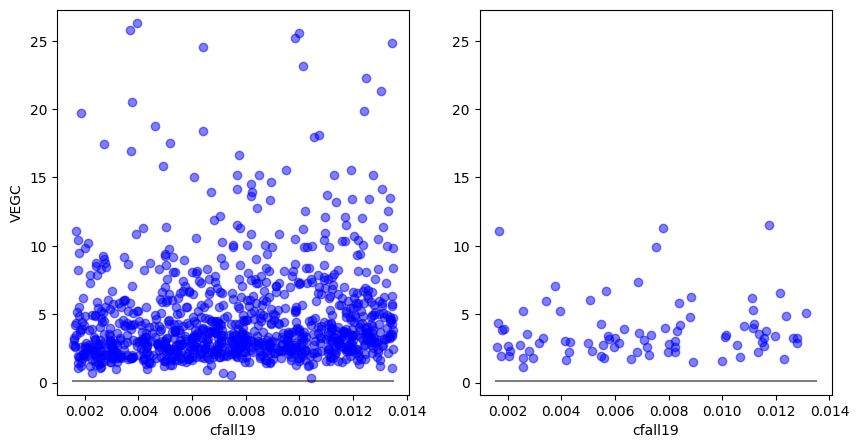

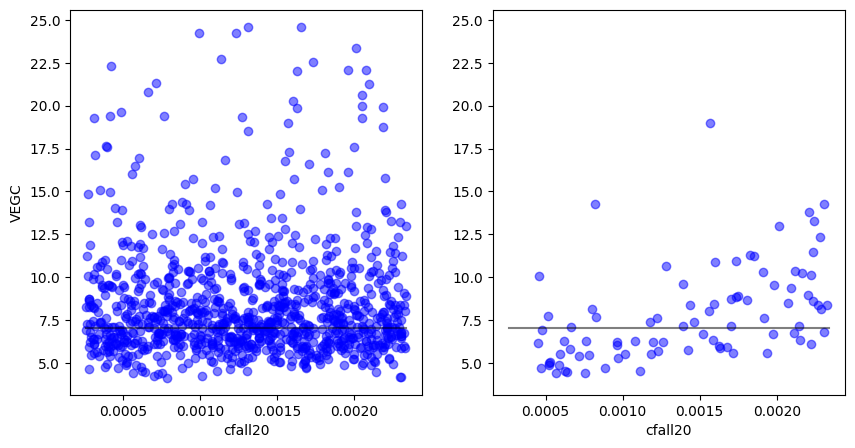

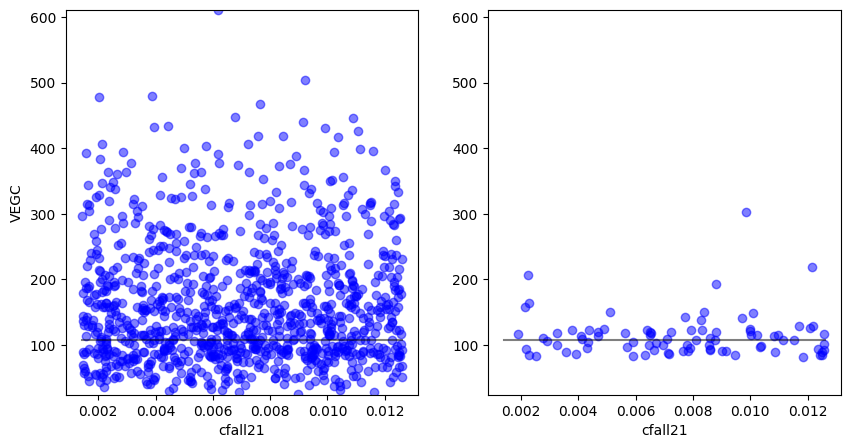

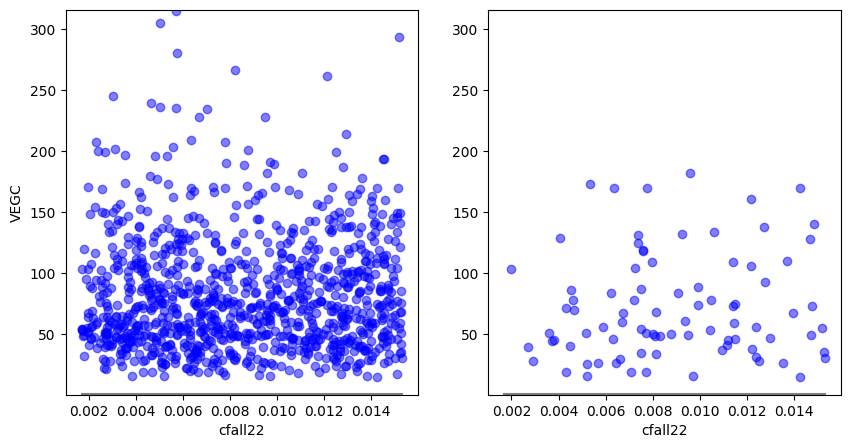

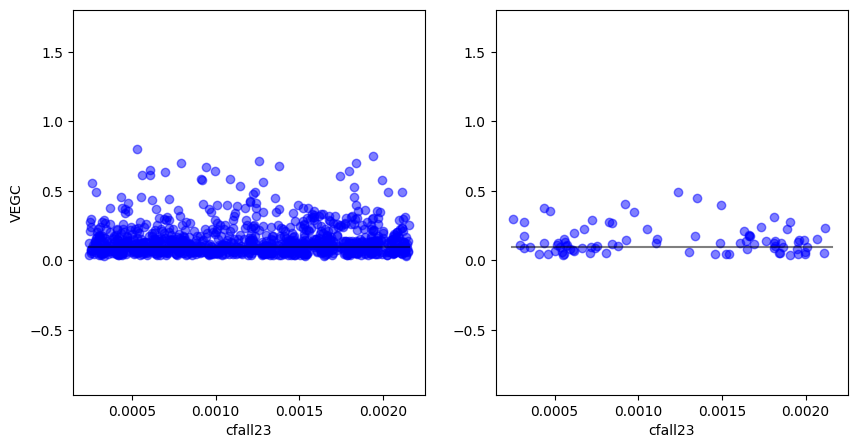

In [5]:
for i in range(14,24):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='cfall'+str(i),ylabel='VEGC')

IndexError: single positional indexer is out-of-bounds

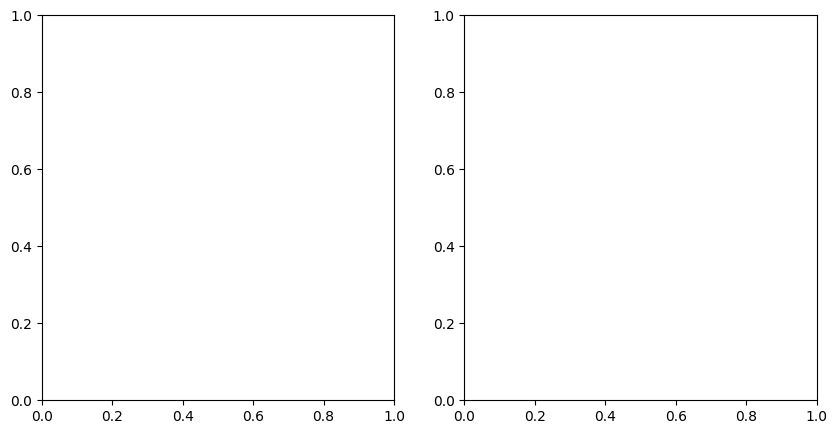

In [9]:
for i in range(24,30):
    ut.plot_paramcvstarget(df_param,df_model,i,r2lim=0.93,xlabel='nfall'+str(i),ylabel='VEGN')

# AC3 Step 1

In [14]:
# AC-MADS Step1 
path='../../dvm-dos-tem/mads_calibration/results/'
path_itr='../../dvm-dos-tem/scripts/'
model='out_AC3-STEP1-MD3-CR_IG.csv'
params='param_AC3-STEP1-MD3-CR_IG.csv'
df_model = pd.read_csv(path+model,header=None)
df_param = pd.read_csv(path+params,header=None)

filenames = ['AC3-STEP1-MD3-CR_IG1.finalresults']
targets='GPP'
mparams=ut.get_all_optimal_sets_of_params(path_itr, filenames)

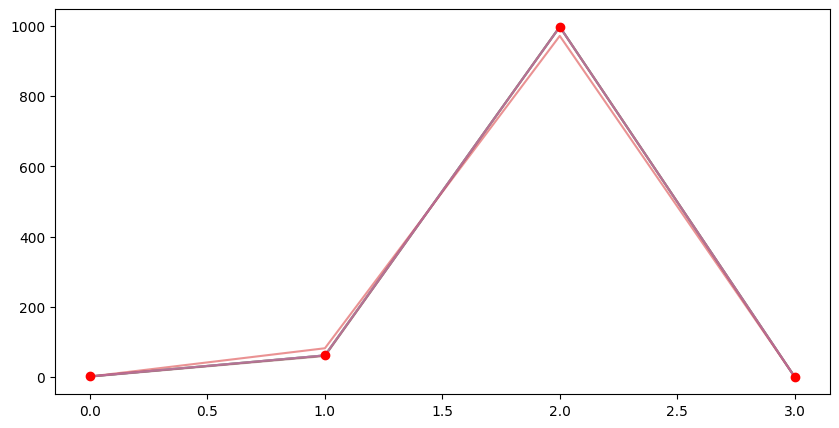

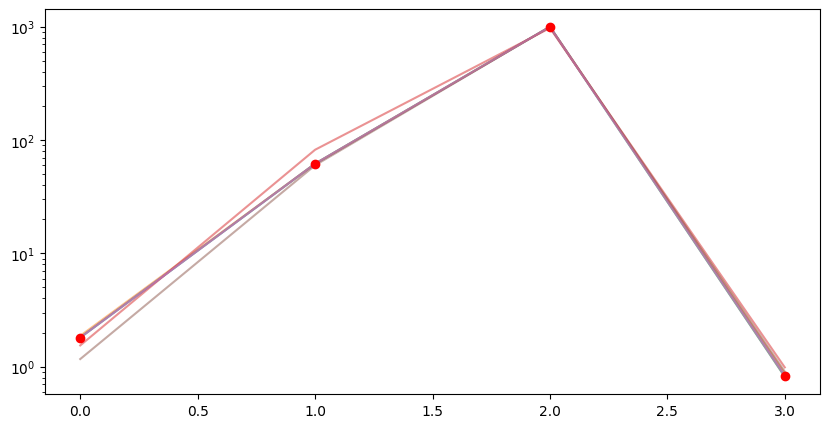

In [16]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

# ut.match_plot(df_model.transpose(),target='GPP')

In [19]:
#plot errors
err=ut.get_error(path_itr, filenames)
print(err)
# ut.plot_err(err)

['2.793388882850204e-6', '0.0008175857380790369', '69.44401228187051', '0.1715723264704097', '1.079087447978125e7', '0.0010083852248775305', '7.0560219909670865', '40508.650435282914', '0.0007053271454708677', '0.007052621552781931']


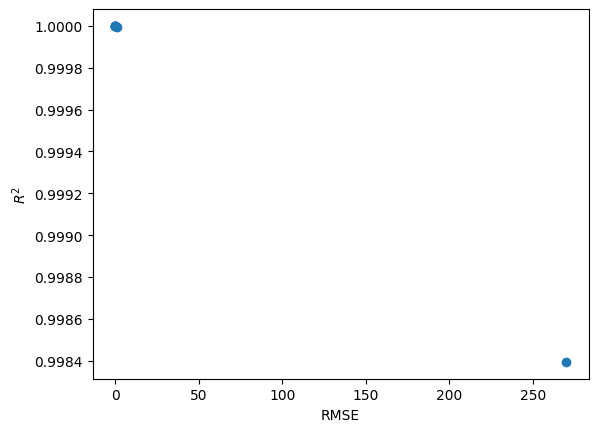

In [18]:
ut.plot_r2_rmse(df_model)

/home/aizax/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


../../dvm-dos-tem/scripts/AC3-STEP1-MD3-CR_IG1.finalresults


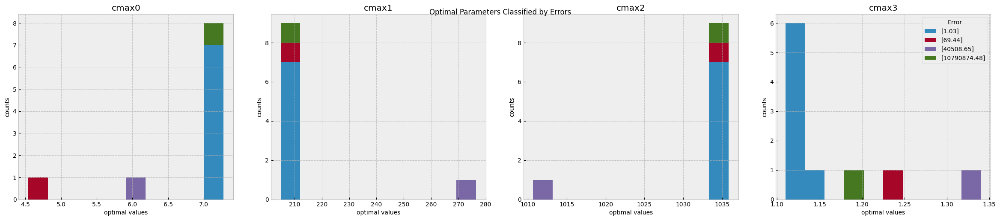

In [20]:
#Get error clusters
float_err=[float(x) for x in err]
rounded_err=list(np.round(float_err,7))
y_kmeans,centers=ut.get_err_clusters(float_err)

# #Organize parameters values by kmeans clusters
ut.plot_stacked_histograms(mparams,centers,y_kmeans,y=26,r=5,c=4,std=0)
import os
for filename in filenames:
    print(os.path.join(path_itr, filename))

# AC3 Step2 - 105 runs total
prior informed initial guess

In [21]:
path='../../dvm-dos-tem/mads_calibration/results/'
path_itr='../../dvm-dos-tem/scripts/'
model='out-AC3-STEP2-MD3.csv'
params='param-AC3-STEP2-MD3.csv'
df_model = pd.read_csv(path+model,header=None)
df_param = pd.read_csv(path+params,header=None)

In [22]:
filenames = ['AC3-STEP2-MD3_1.finalresults', 'AC3-STEP2-MD3_2.finalresults', 'AC3-STEP2-MD3_3.finalresults',
            'AC3-STEP2-MD3_4.finalresults', 'AC3-STEP2-MD3_5.finalresults', 'AC3-STEP2-MD3_6.finalresults', 
            'AC3-STEP2-MD3_7.finalresults']
targets='NPP/VEGC'
mparams=ut.get_all_optimal_sets_of_params(path_itr, filenames)

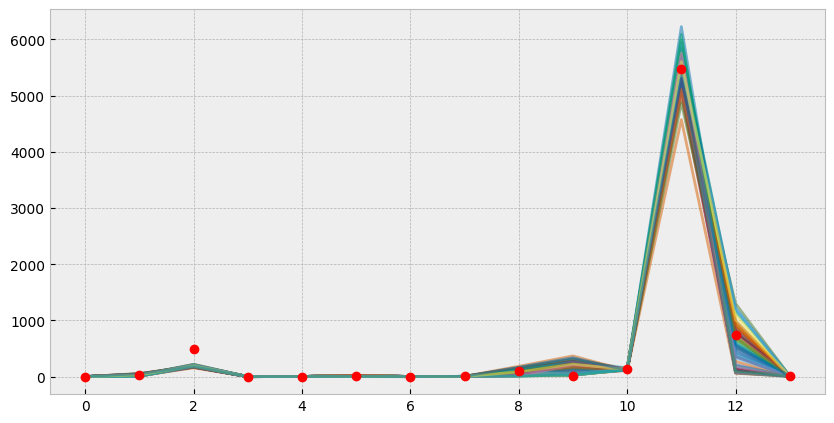

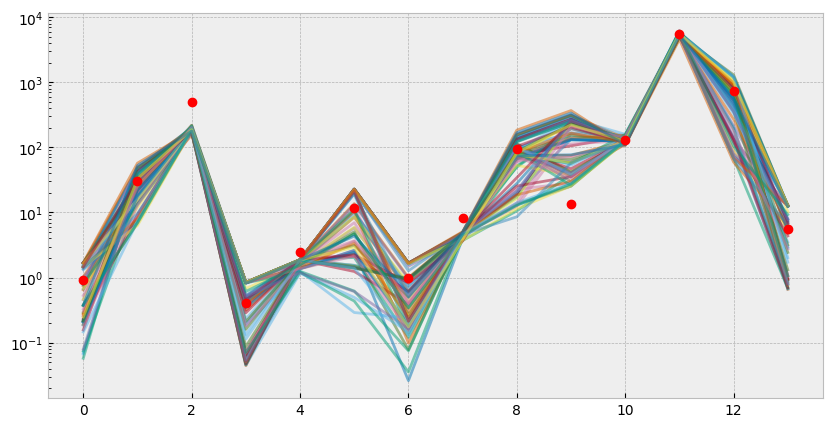

In [23]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

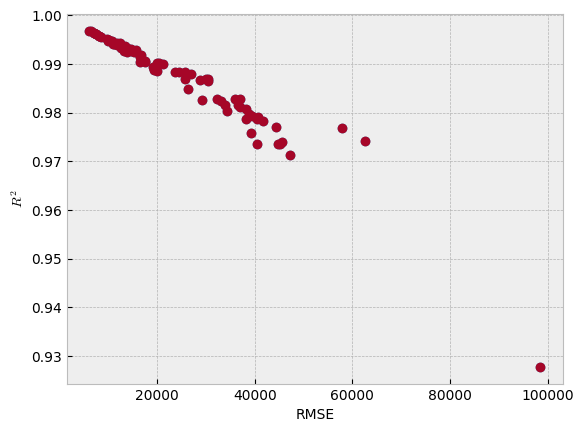

In [27]:
[n,m]=np.shape(df_model)
r2=[r2_score(df_model.iloc[i,:], df_model.iloc[-1,:]) for i in range(n-1)]
rmse=[mean_squared_error(df_model.iloc[i,:], df_model.iloc[-1,:]) for i in range(n-1)]
r2=np.asarray(r2)
rmse=np.asarray(rmse)
plt.plot(rmse,r2,'o'), plt.xlabel('RMSE'), plt.ylabel('$R^2$');
ut.plot_r2_rmse(df_model)

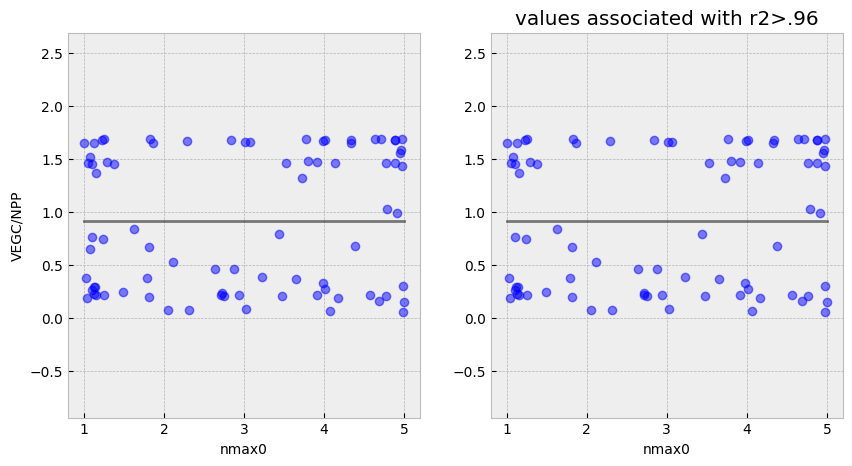

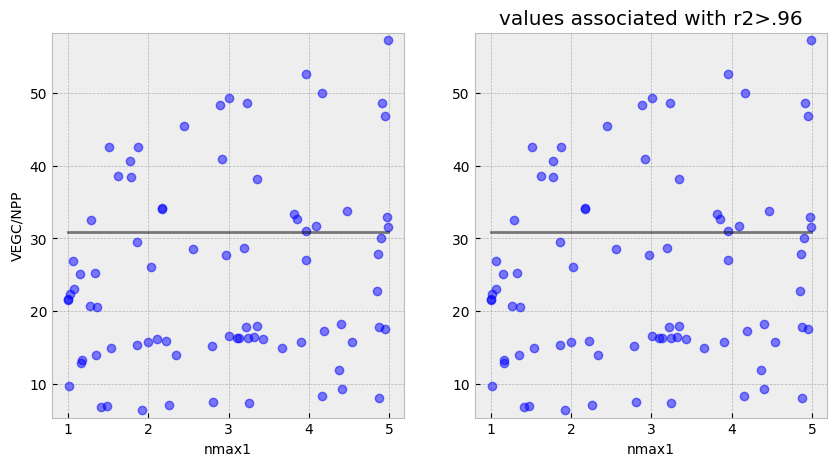

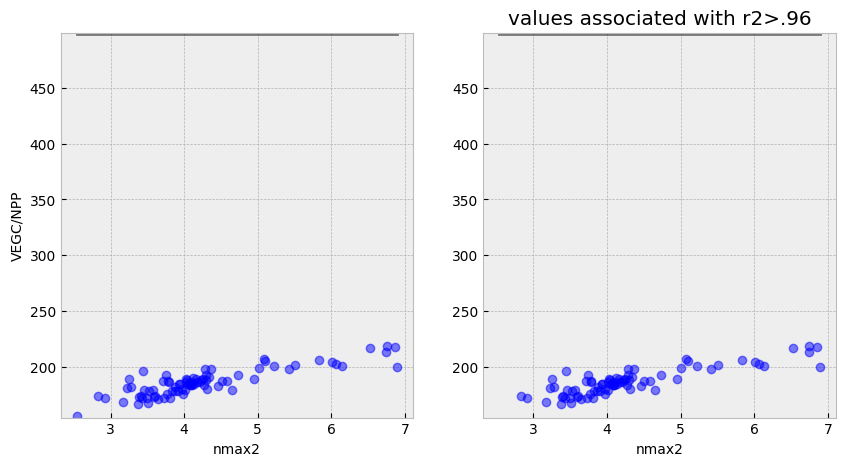

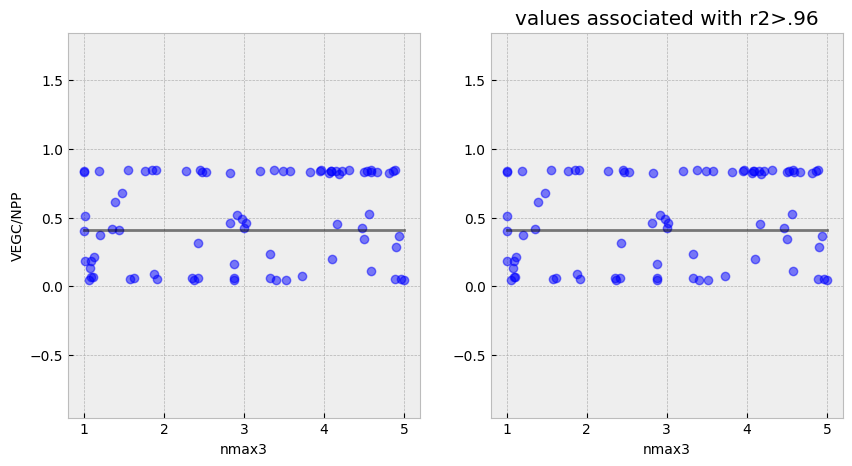

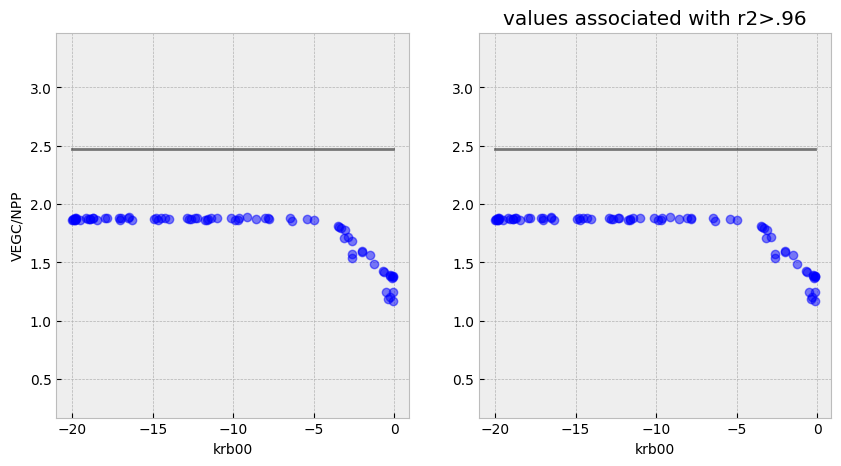

...

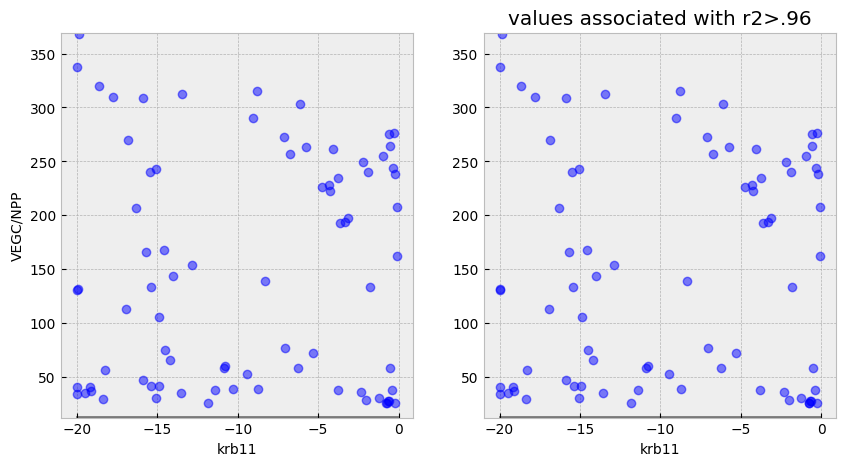

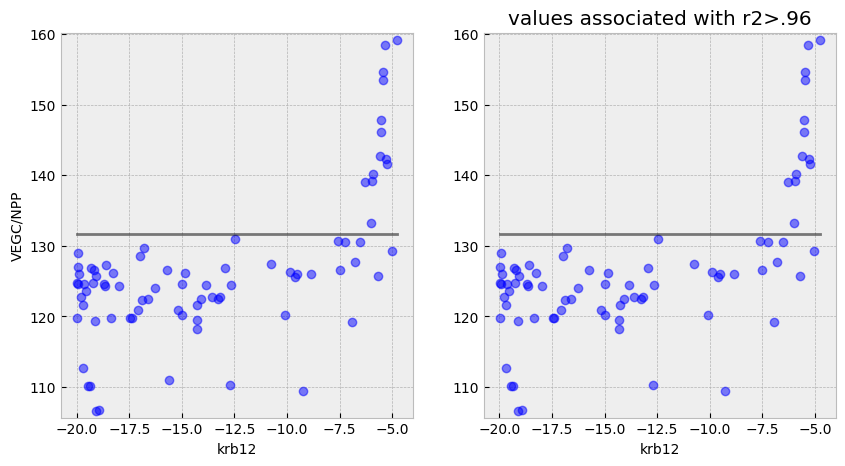

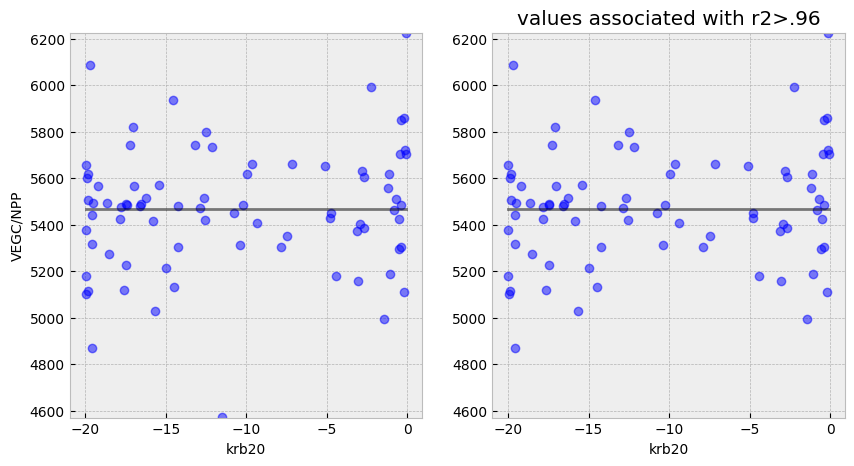

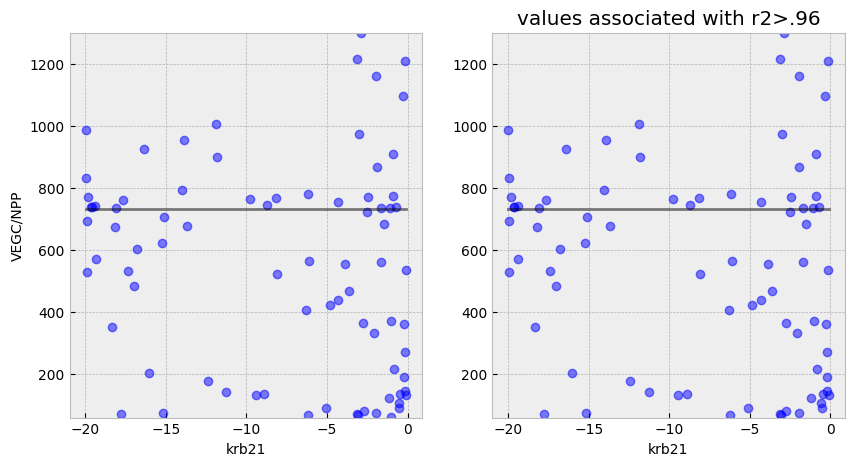

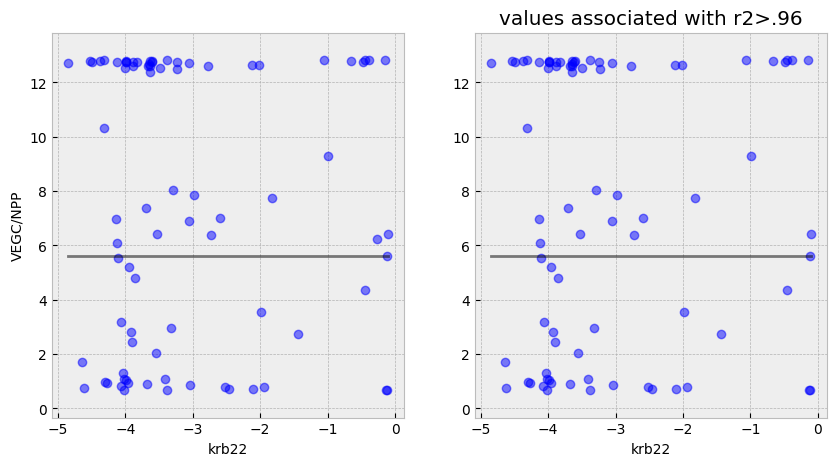

In [28]:
#this assumes a 1-1 relationship between obs and params
i=0
for item in mparams:
    ut.plot_paramsvstarget(df_param,df_model,r2,i,xlabel=item,ylabel='VEGC/NPP')
    i=i+1

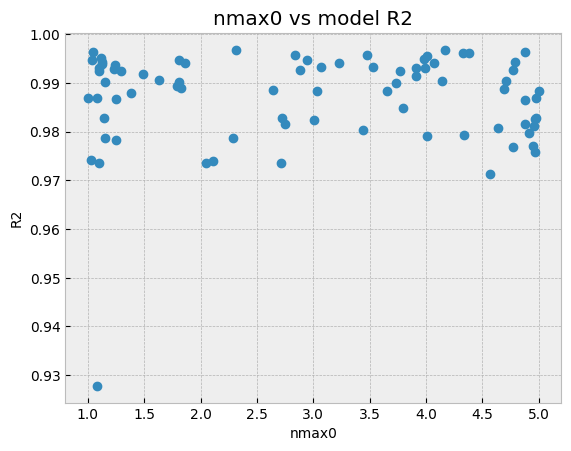

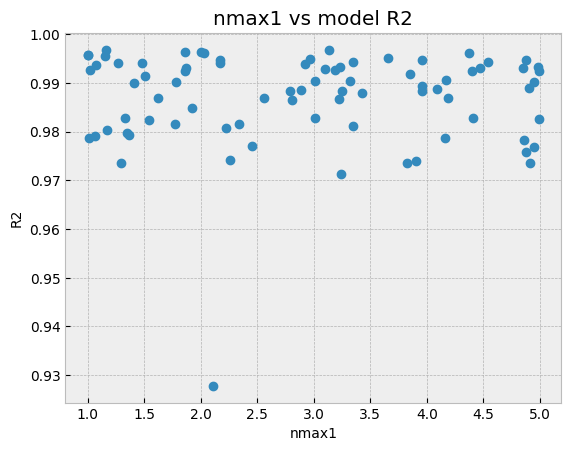

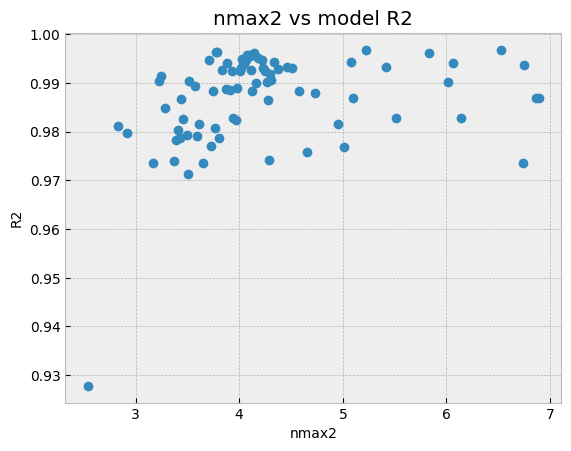

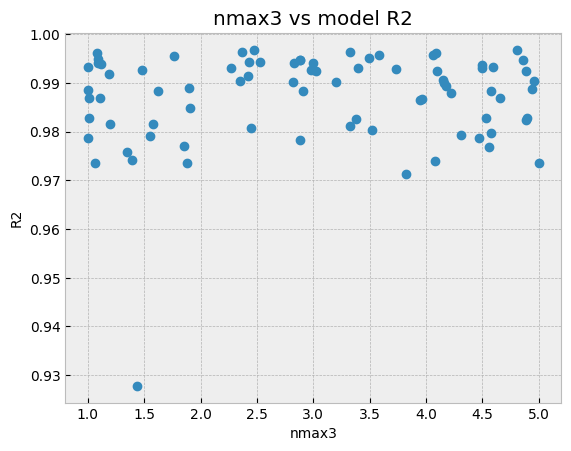

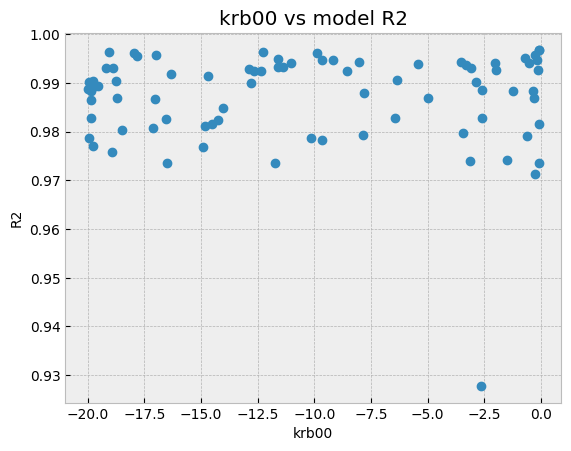

...

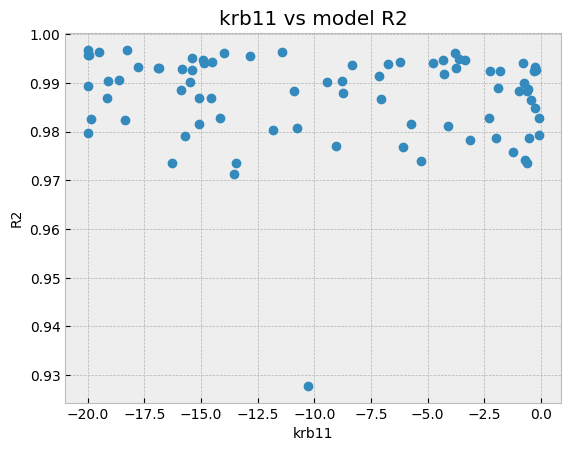

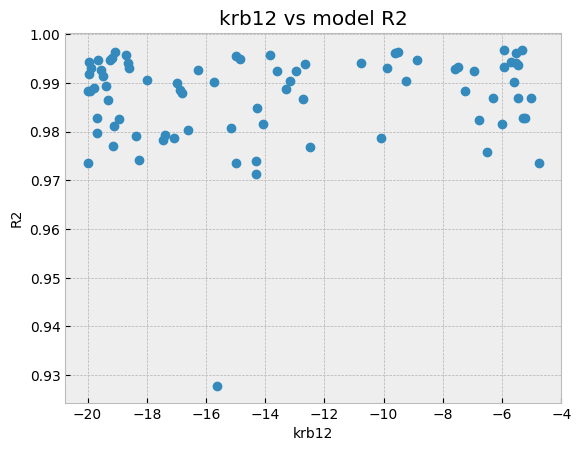

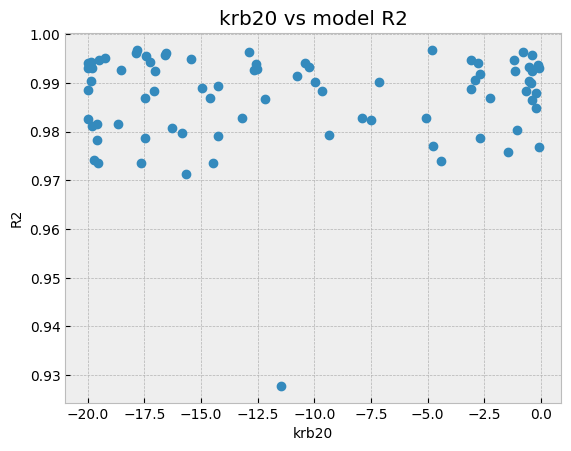

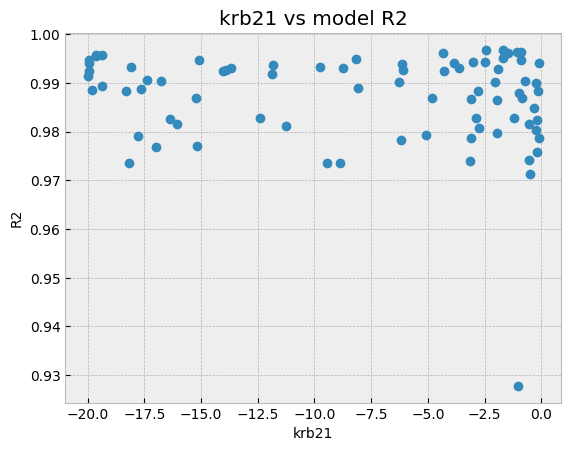

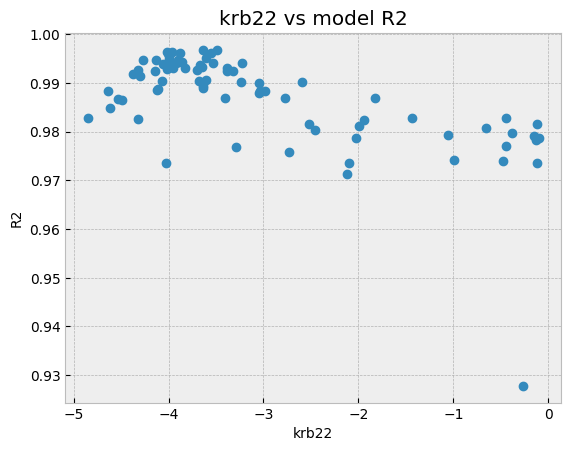

In [29]:
i=0
for item in mparams:
    plt.figure()
    plt.plot(df_param.iloc[:,i],r2,'o');
    plt.xlabel(item), plt.ylabel('R2');
    plt.title(item+' vs model R2')
    i=i+1

In [ ]:
# AC Step3 - comparable to AC3 step 2
#Could not generate the out file correctly??
# path='../../dvm-dos-tem/mads_calibration/'
# model='out_AC-STEP3-MD3_CR_forcedist.csv'
# params='param_AC-STEP3-MD3_CR_forcedist.csv'
# df_model = pd.read_csv(path+model,header=None)
# df_param = pd.read_csv(path+params,header=None)

filenames = ['STEP3-MD3_CR_forcedist.finalresults', 'STEP3-MD3_CR_forcedist2.finalresults', 
      'STEP3-MD3_CR_forcedist3.finalresults', 'STEP3-MD3_CR_forcedist4.finalresults',
             'STEP3-MD3_CR_forcedist5.finalresults', 'STEP3-MD3_CR_forcedist6.finalresults']
targets='NPP/VEGC'
mparams=ut.get_all_optimal_sets_of_params(path_itr, filenames)

# AC-MADS Step2 - no prior

In [30]:
path='../../dvm-dos-tem/mads_calibration/results/'
path_itr='../../dvm-dos-tem/mads_calibration/'
model='out_STEP2-MD3-CR-noprior.csv'
params='param_STEP2-MD3-CR-noprior.csv'
df_model = pd.read_csv(path+model,header=None)
df_param = pd.read_csv(path+params,header=None)

filenames = ['STEP2-MD3-CR-noprior.finalresults', 'STEP2-MD3-CR-noprior_2.finalresults', 'STEP2-MD3-CR-noprior_3.finalresults',
      'STEP2-MD3-CR-noprior_4.finalresults']
targets='NPP/VEGC/VEGN'
mparams=ut.get_all_optimal_sets_of_params(path_itr, filenames)

In [31]:
mparams=ut.get_optimal_sets_of_params(path_itr+filenames[0]) 
for i in filenames[1:]:
    mparams = ut.merge_parameter(mparams, ut.get_optimal_sets_of_params(path_itr+i))

['3.0084071769907894e9', '5.117590989188484e9', '7.701610818594249e9', '2.9200150515013757e9', '4.036914484677113e9', '3.8421883154820595e9', '1.5104039518891714e9', '2.994384639861488e9', '1.0767210013236706e9', '4.373775132446365e9', '1.3827351808848991e10', '3.632496778590681e9', '1.825583634110823e9', '1.7942857957271342e9', '1.4531217189743454e9', '4.1472852474612784e9', '1.208259727258036e10', '5.944714719475805e9', '4.1205666366453376e9', '1.8796114901932762e10', '3.093135562703902e9', '2.5412686589183945e10', '4.882713088350221e9', '5.701257920820839e9', '1.2838084914062722e9', '5.670085305858423e9', '5.952788964262233e9', '1.070517897770958e9']


/home/aizax/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/aizax/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


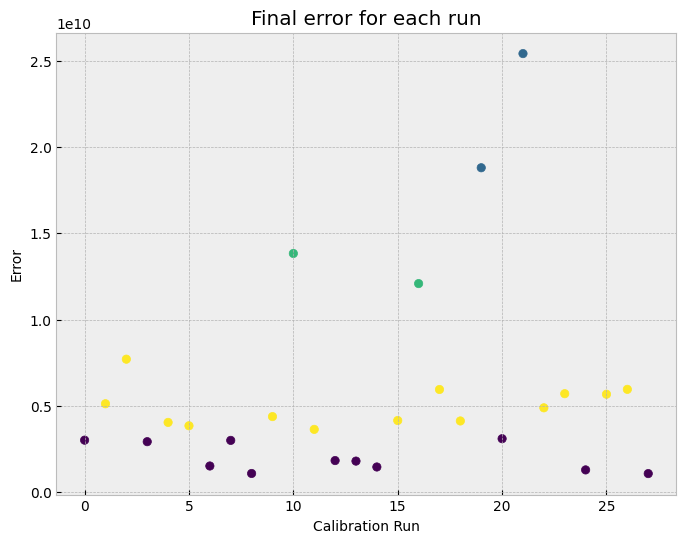

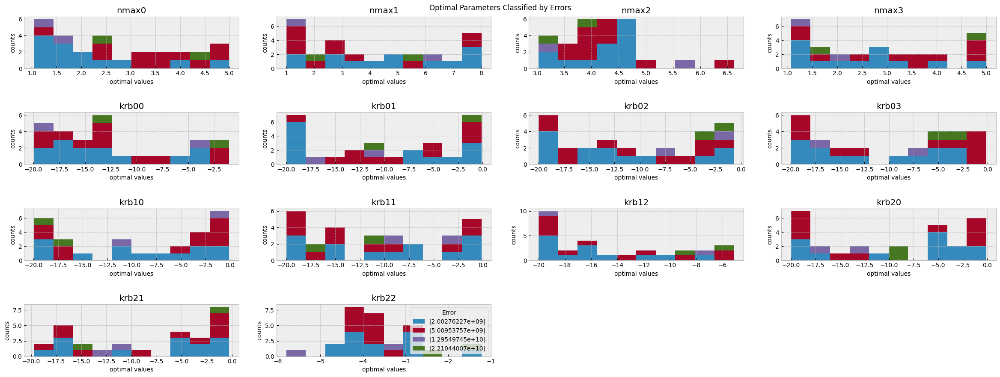

In [32]:
#plot errors
err=ut.get_error(path_itr, filenames)
print(err)
ut.plot_err(err)

#Get error clusters 
float_err=[float(x) for x in err]
rounded_err=list(np.round(float_err,7))
y_kmeans,centers=ut.get_err_clusters(float_err)

#Organize parameters values by kmeans clusters
ut.plot_stacked_histograms(mparams,centers, y_kmeans, r=8, y=18, nbins=10, std=0)

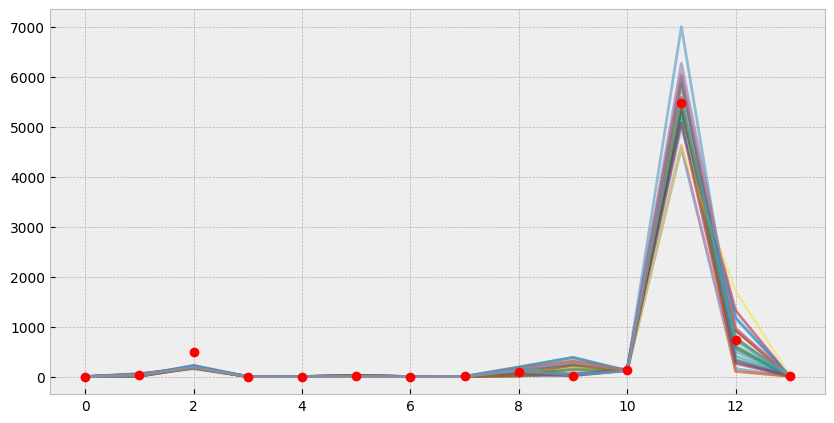

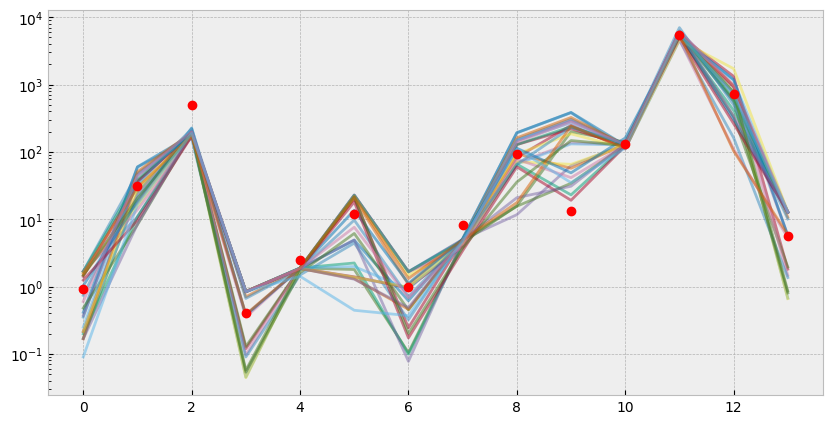

In [33]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

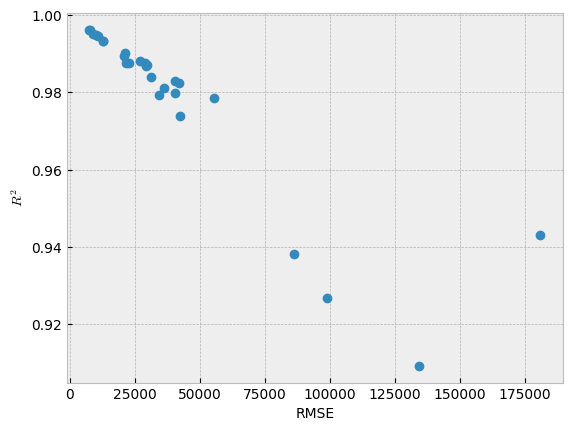

In [34]:
ut.plot_r2_rmse(df_model)

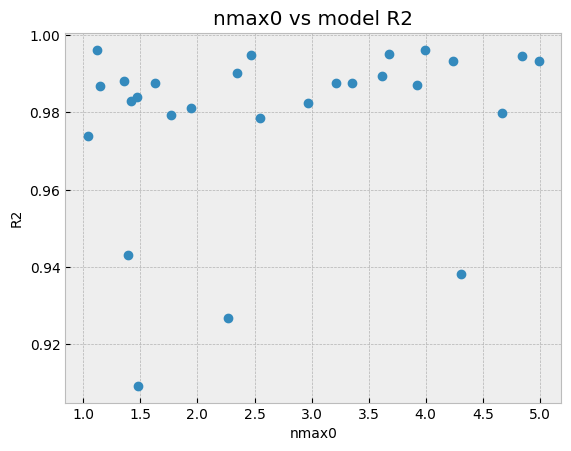

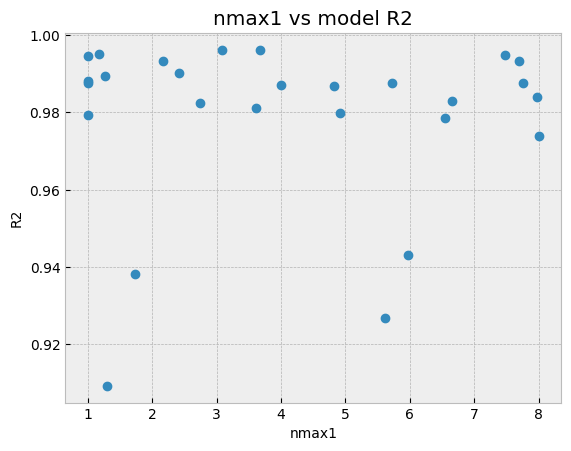

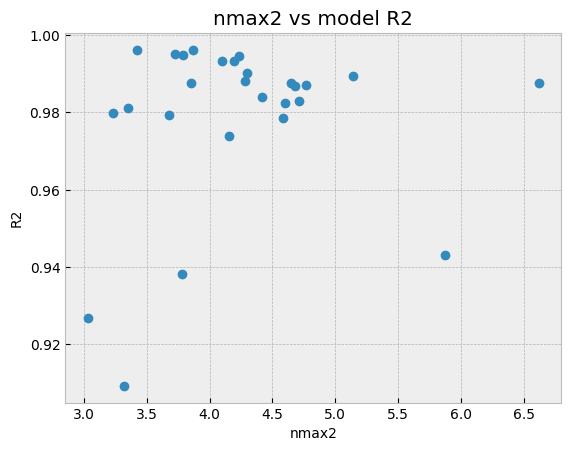

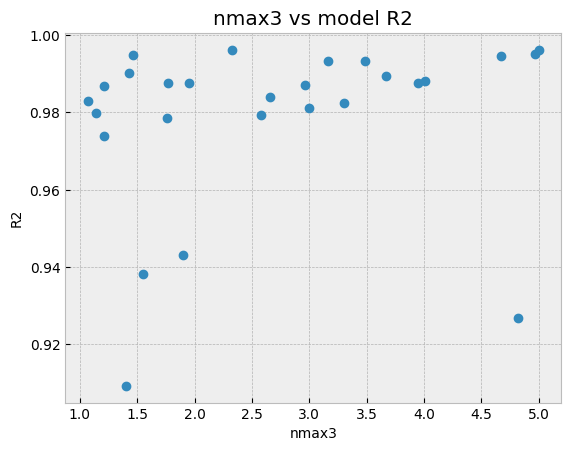

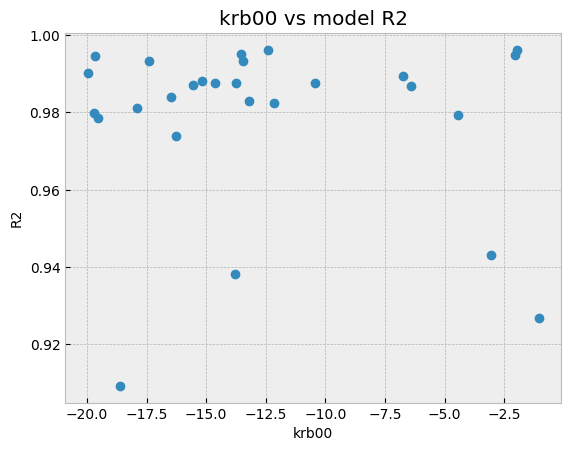

...

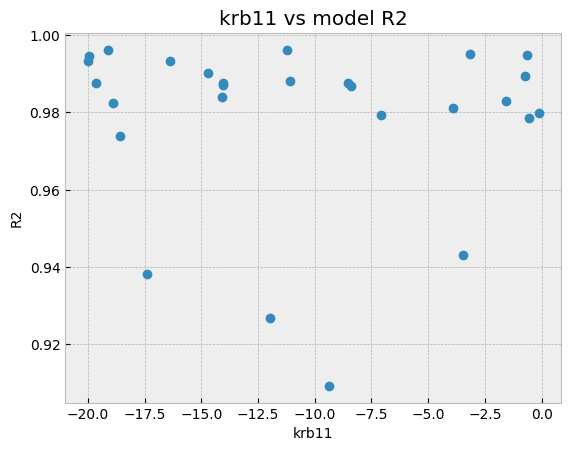

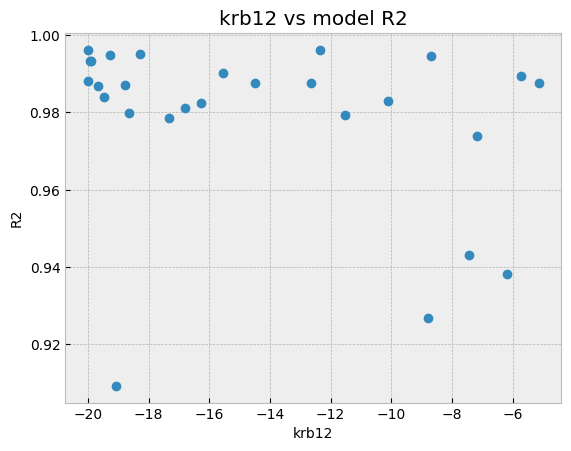

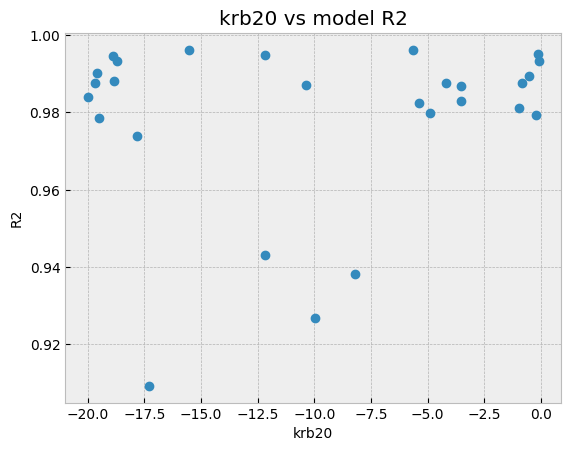

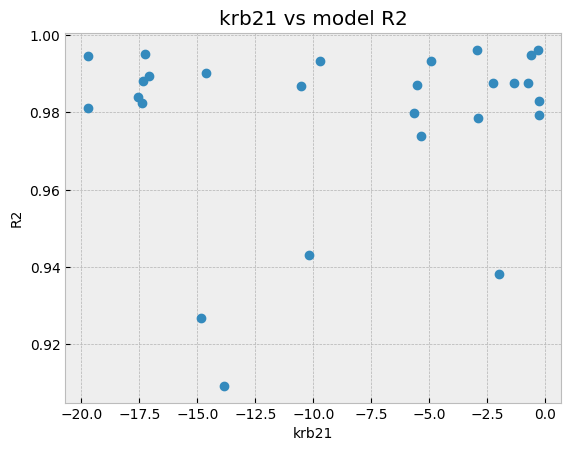

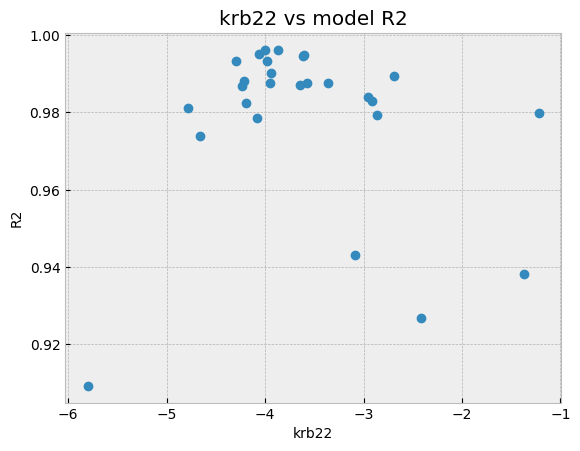

In [35]:
[n,m]=np.shape(df_model)
r2=[r2_score(df_model.iloc[i,:], df_model.iloc[-1,:]) for i in range(n-1)]
rmse=[mean_squared_error(df_model.iloc[i,:], df_model.iloc[-1,:]) for i in range(n-1)]
r2=np.asarray(r2)
rmse=np.asarray(rmse)

i=0
for item in mparams:
    plt.figure()
    plt.plot(df_param.iloc[:,i],r2,'o');
    plt.xlabel(item), plt.ylabel('R2');
    plt.title(item+' vs model R2')
    i=i+1

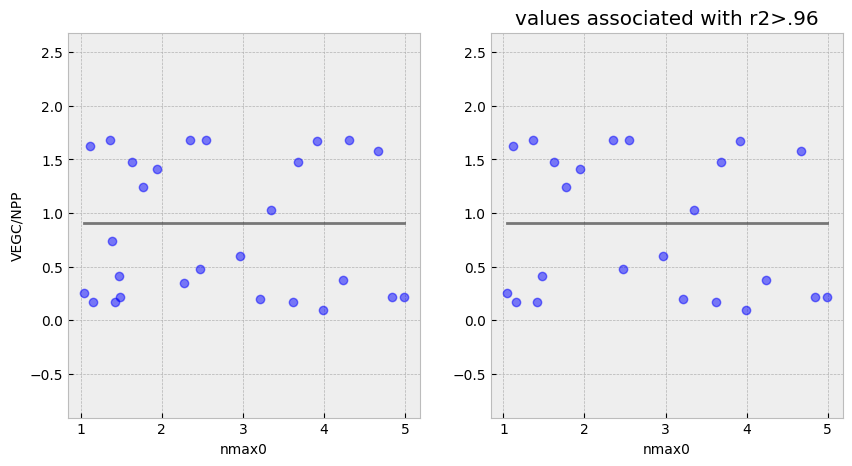

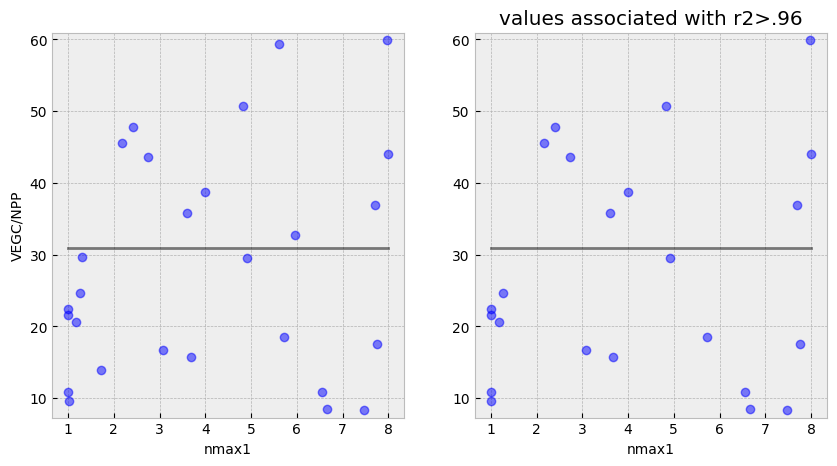

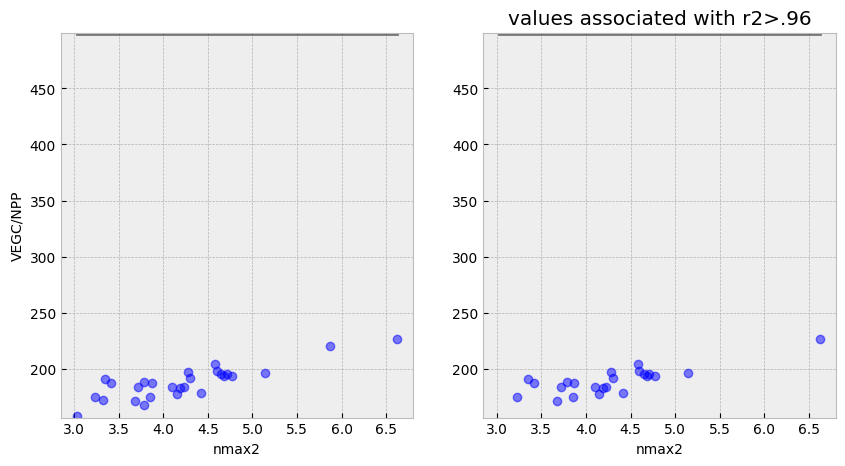

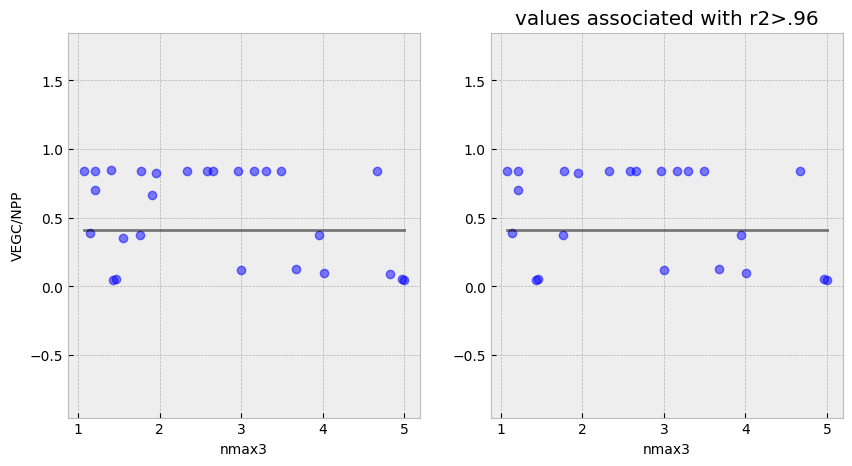

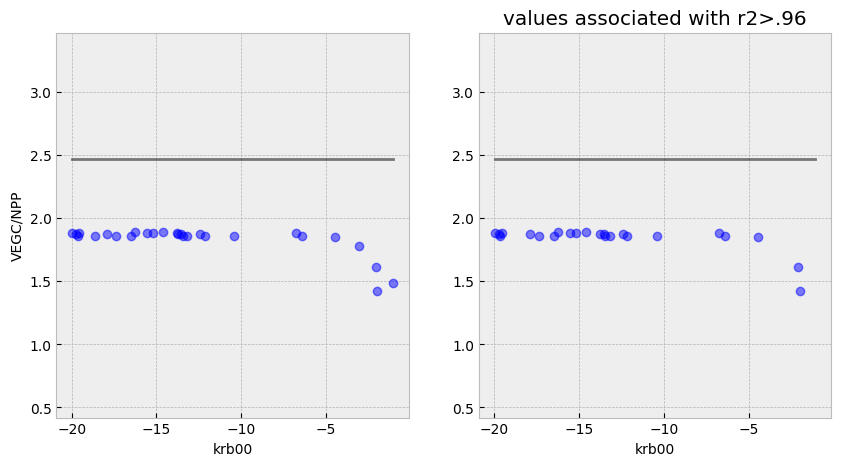

...

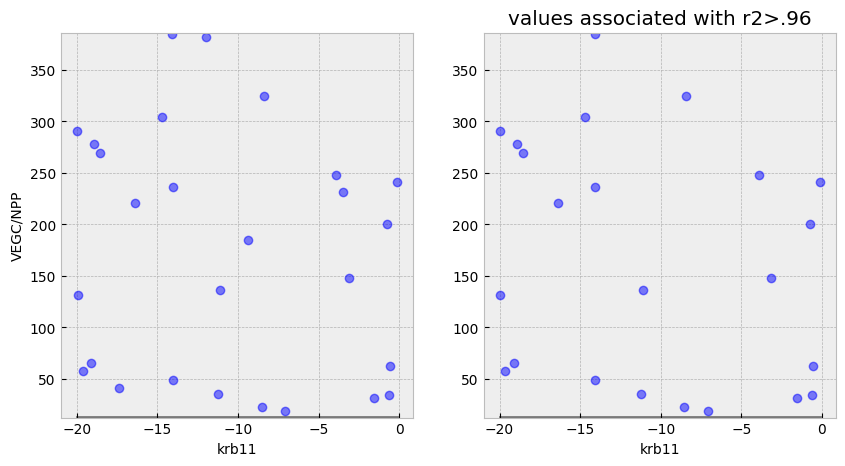

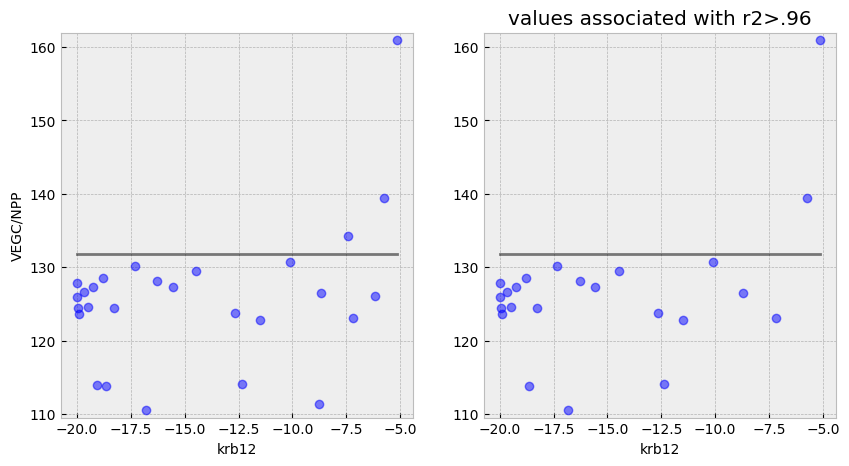

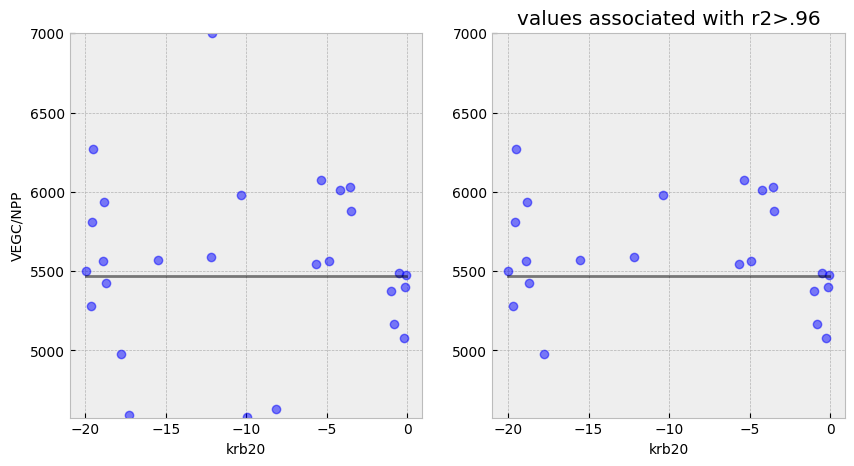

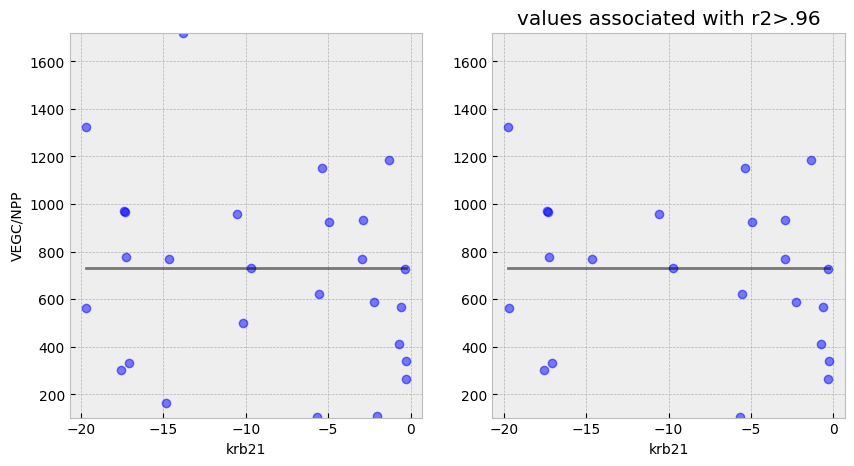

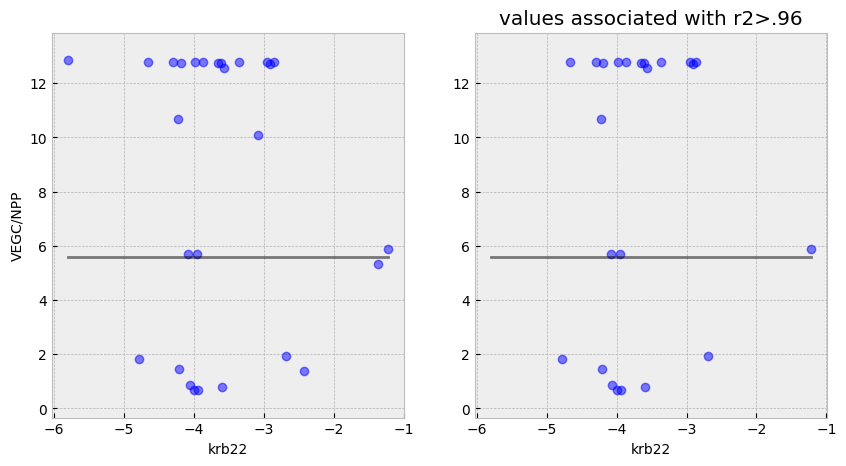

In [36]:
#this assumes a 1-1 relationship between obs and params
i=0
for item in mparams:
    ut.plot_paramsvstarget(df_param,df_model,r2,i,xlabel=item,ylabel='VEGC/NPP')
    i=i+1

# AC-MADS Step3 - no prior for initial guess

In [37]:
path='../../dvm-dos-tem/mads_calibration/results/'
path_itr='../../dvm-dos-tem/mads_calibration/'
model='out_STEP3-MD3-CR-noprior.csv'
params='param_STEP3-MD3-CR-noprior.csv'
df_model = pd.read_csv(path+model,header=None)
df_param = pd.read_csv(path+params,header=None)

filenames = ['STEP3-MD3-CR-noprior_1.finalresults', 'STEP3-MD3-CR-noprior_2.finalresults', 'STEP3-MD3-CR-noprior_3.finalresults',
      'STEP3-MD3-CR-noprior_4.finalresults', 'STEP3-MD3-CR-noprior_5.finalresults', 'STEP3-MD3-CR-noprior_6.finalresults',
      'STEP3-MD3-CR-noprior_7.finalresults']
targets='NPP/VEGC/VEGN'
mparams=ut.get_all_optimal_sets_of_params(path_itr, filenames)

In [38]:
mparams=ut.get_optimal_sets_of_params(path_itr+filenames[0]) 
for i in filenames[1:]:
    mparams = ut.merge_parameter(mparams, ut.get_optimal_sets_of_params(path_itr+i))

['1.6466577157668924e10', '3.69788792944791e10', '4.4133740424830475e9', '4.476222654664731e9', '9.295524214217215e9', '2.903047292676514e9', '7.588190246544192e9', '4.770065319015016e9', '2.554437580175758e10', '1.1242795083269922e10', '6.475838037784684e9', '3.2064837501824727e9', '1.6335128387299234e10', '3.8965544289540668e9', '1.601238027738714e10', '8.589779212668712e9', '1.8932057284206011e9', '2.649191699822669e10', '2.2067188043103745e10', '4.2725071917877774e9', '2.49181084106985e10', '3.0245303454003414e10', '8.135724678679095e9', '2.734783947021159e9', '2.8464862135973134e9', '1.22793086212523e10', '4.930145491262282e9', '6.842709392552009e9', '9.298569306965056e10', '7.8540790388691025e9', '8.427063202303281e9', '7.970167385926865e9', '1.642440009853605e10', '1.0603465618861303e8', '1.3053753674975862e8', '7.253493346589989e9', '1.361636062164636e10', '1.917386459944789e10', '5.258262419697375e9', '2.2057452690774952e10', '7.6830172685855875e9', '5.740341450825839e9', '8.9

/home/aizax/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/aizax/.local/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


ValueError: num must be an integer with 1 <= num <= 32, not 33

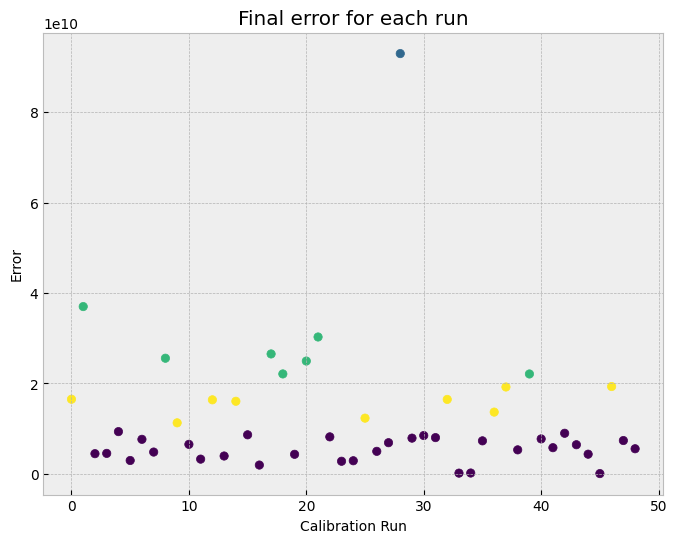

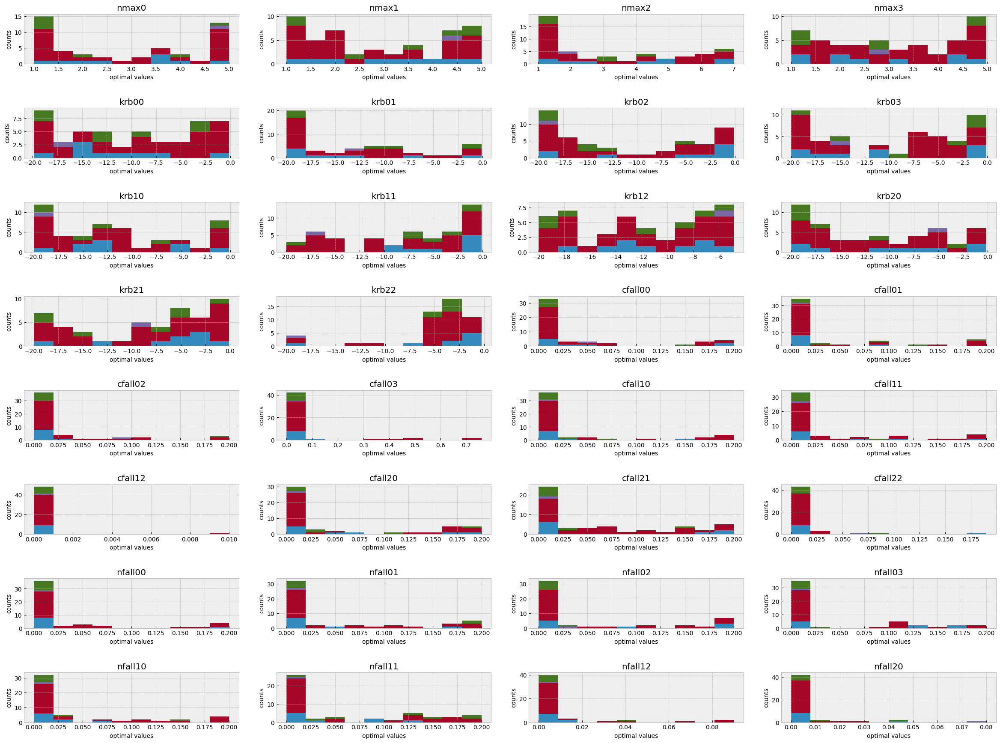

In [39]:
#plot errors
err=ut.get_error(path_itr, filenames)
print(err)
ut.plot_err(err)

#Get error clusters 
float_err=[float(x) for x in err]
rounded_err=list(np.round(float_err,7))
y_kmeans,centers=ut.get_err_clusters(float_err)

#Organize parameters values by kmeans clusters
ut.plot_stacked_histograms(mparams,centers, y_kmeans, r=8, y=18, nbins=10, std=0)

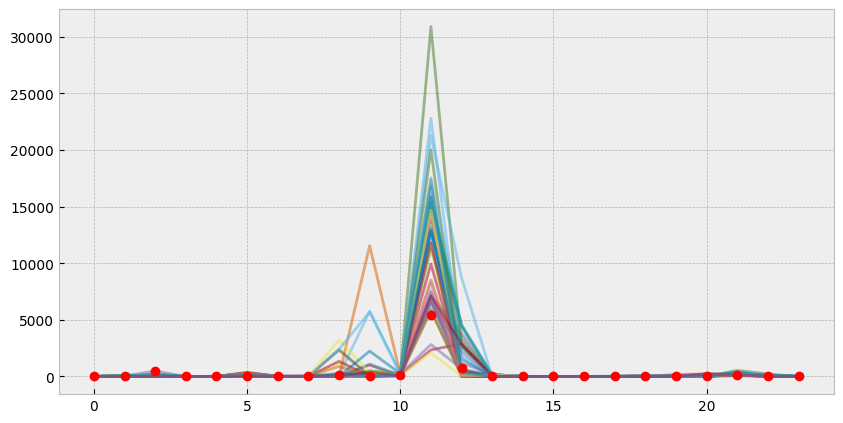

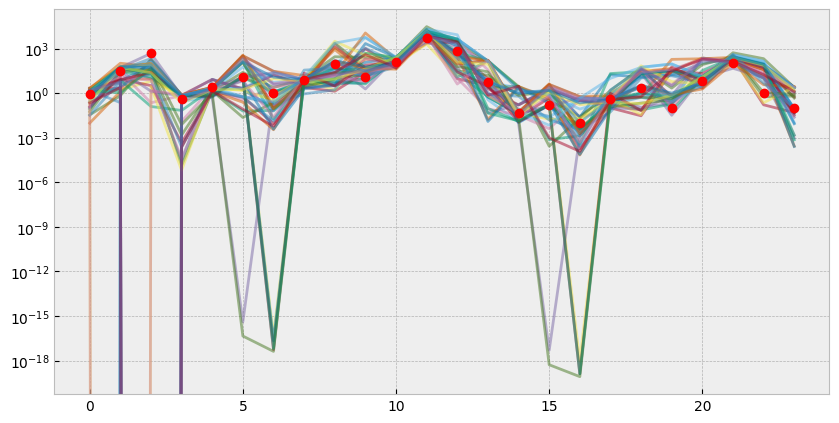

In [41]:
ut.spaghetti_match_plot(df_model)
ut.spaghetti_match_plot(df_model,logy=True)

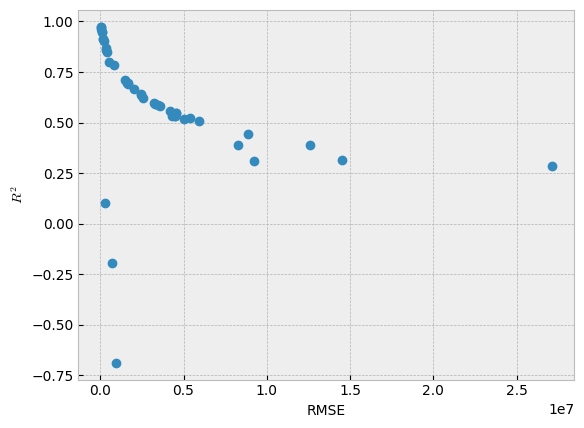

In [42]:
[n,m]=np.shape(df_model)
r2=[r2_score(df_model.iloc[i,:], df_model.iloc[-1,:]) for i in range(n-1)]
rmse=[mean_squared_error(df_model.iloc[i,:], df_model.iloc[-1,:]) for i in range(n-1)]
r2=np.asarray(r2)
rmse=np.asarray(rmse)
plt.plot(rmse,r2,'o'), plt.xlabel('RMSE'), plt.ylabel('$R^2$');

/tmp/ipykernel_21374/573042984.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


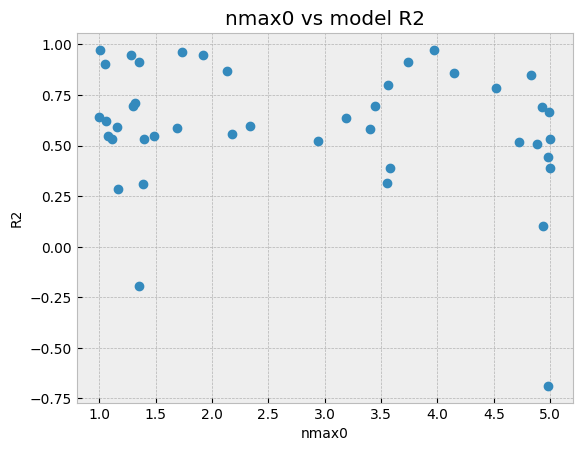

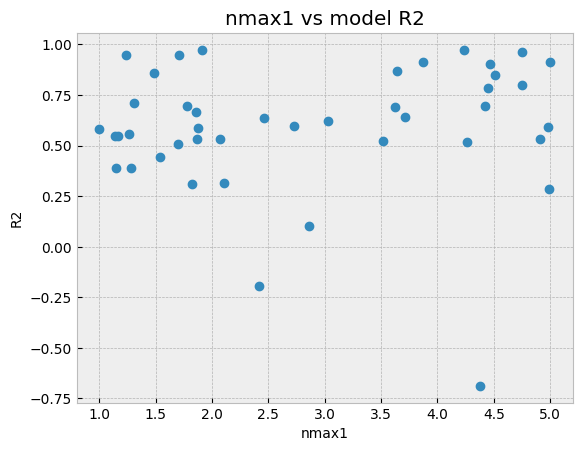

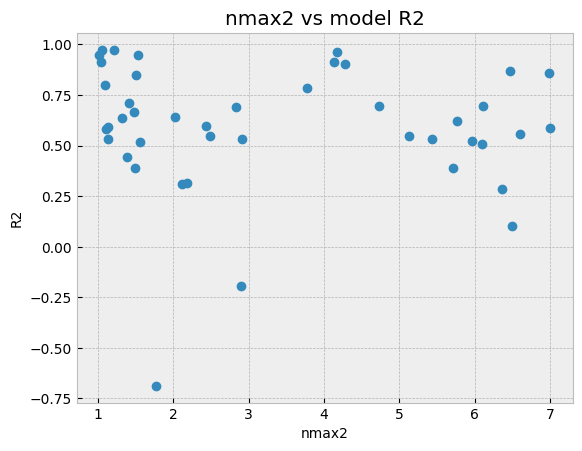

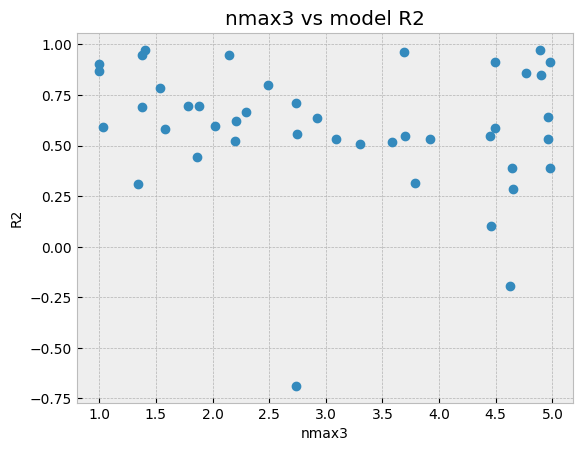

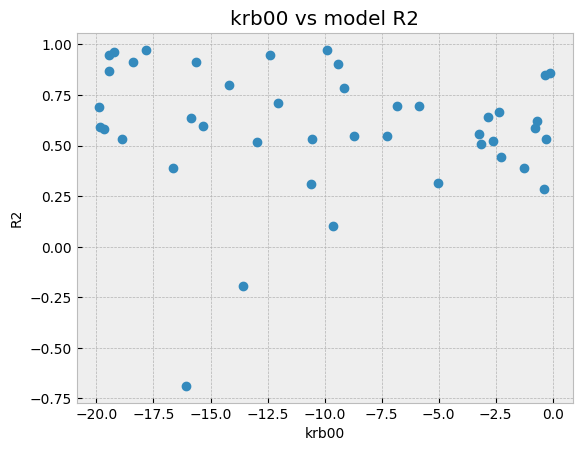

...

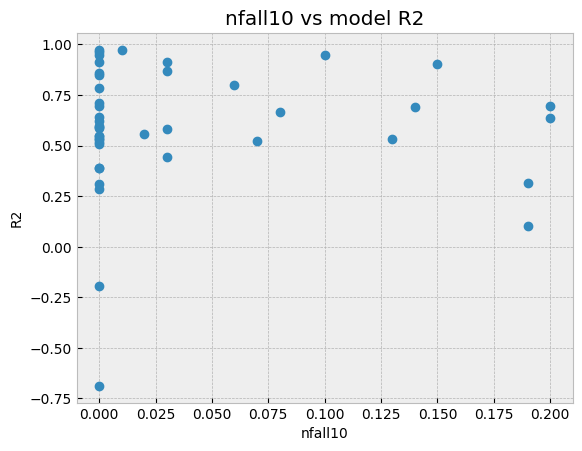

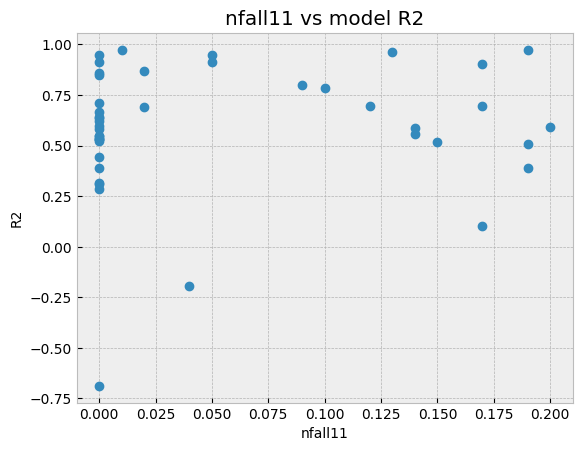

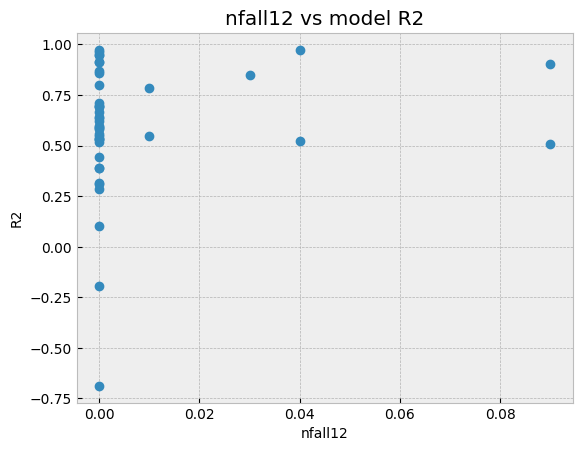

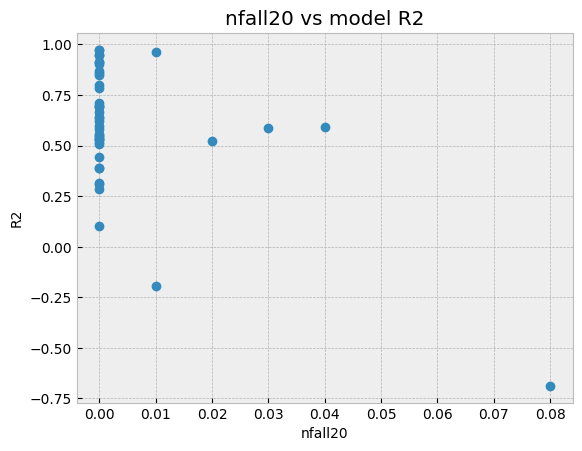

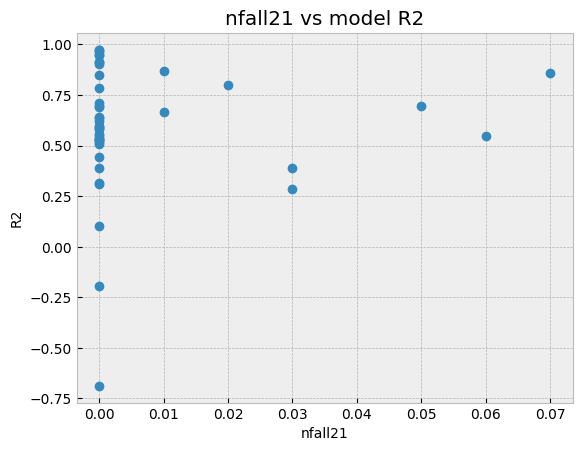

In [43]:
i=0
for item in mparams:
    plt.figure()
    plt.plot(df_param.iloc[:,i],r2,'o');
    plt.xlabel(item), plt.ylabel('R2');
    plt.title(item+' vs model R2')
    i=i+1

/home/akabeer/post_processing_git/MADS-TEM-calibration/utils.py:578: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))


IndexError: single positional indexer is out-of-bounds

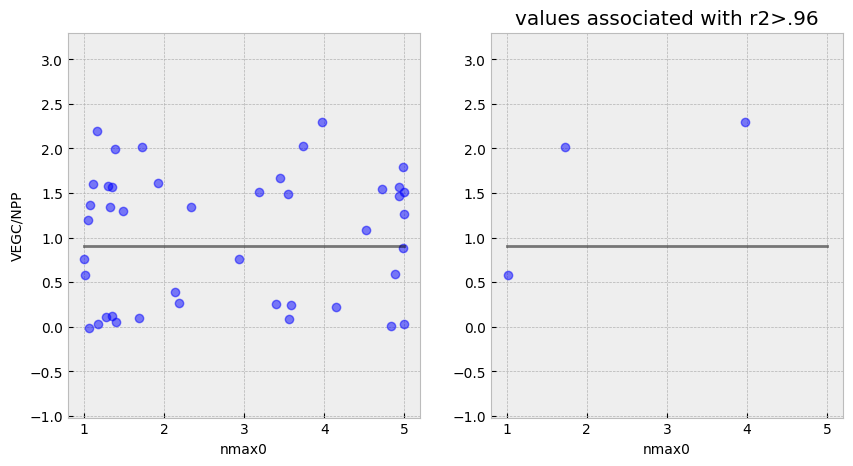

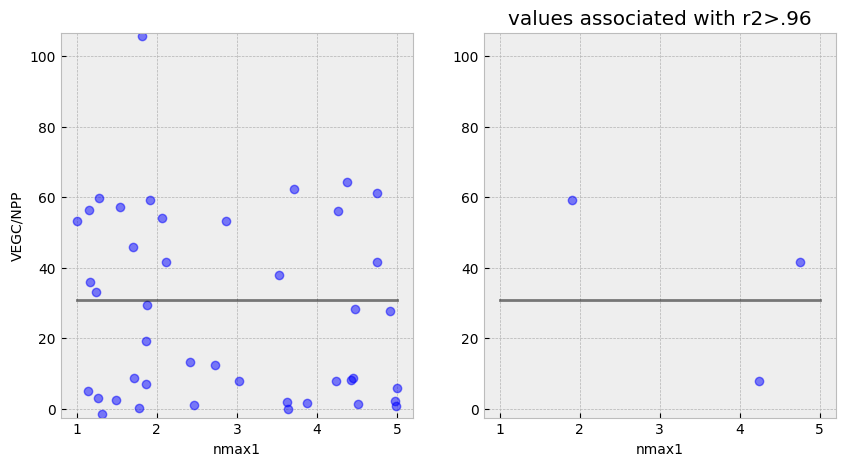

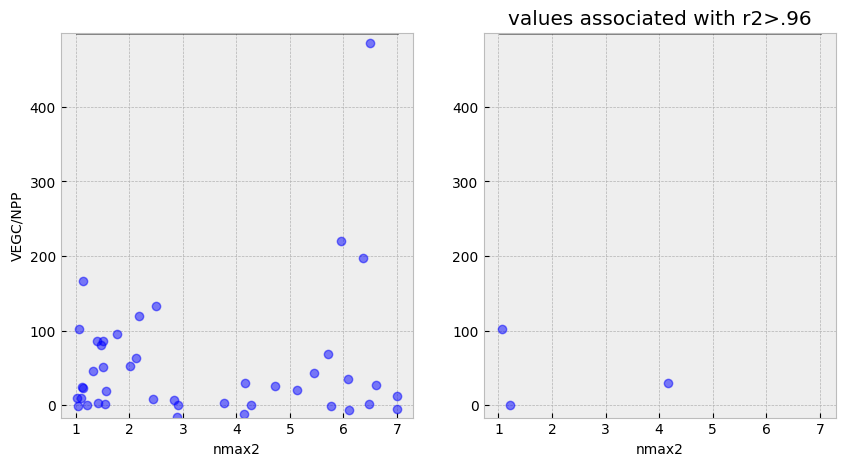

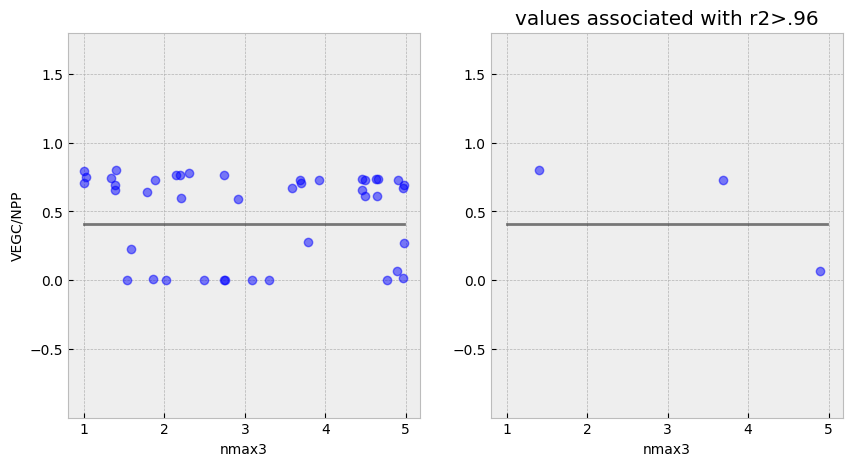

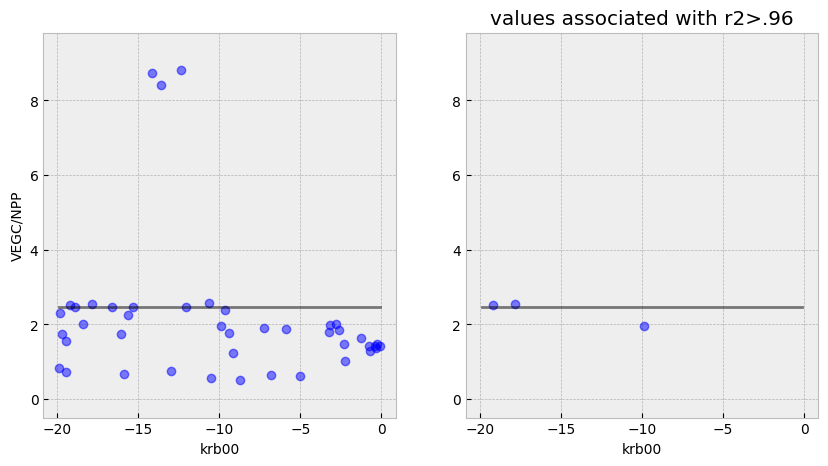

...

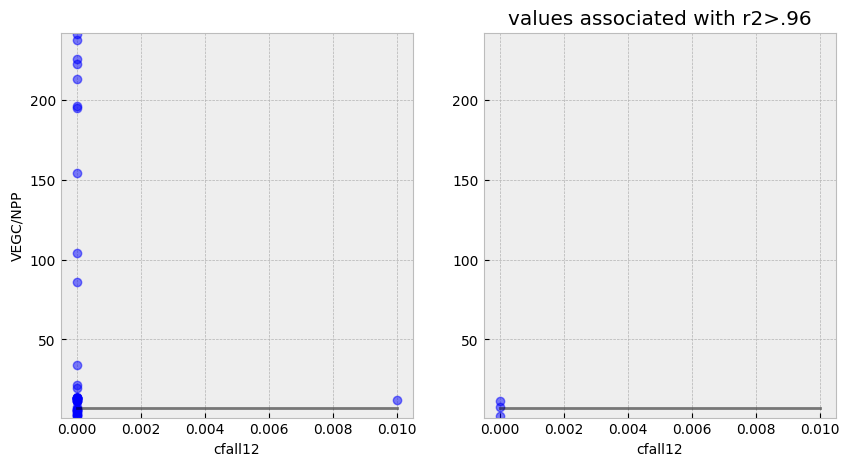

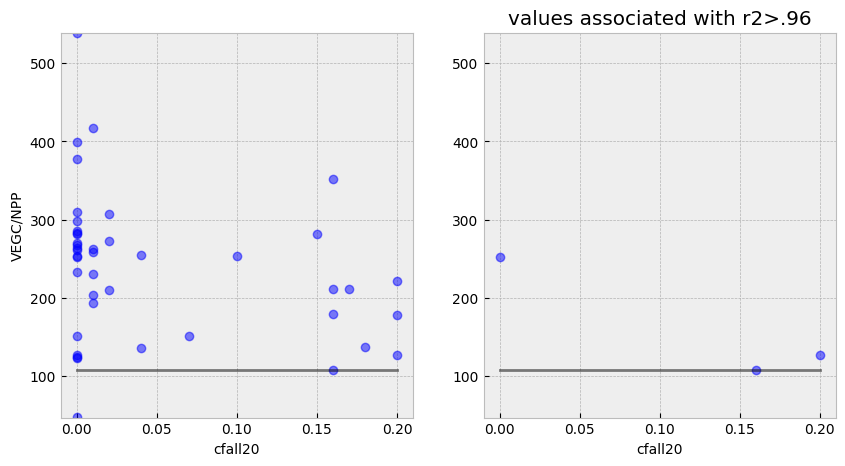

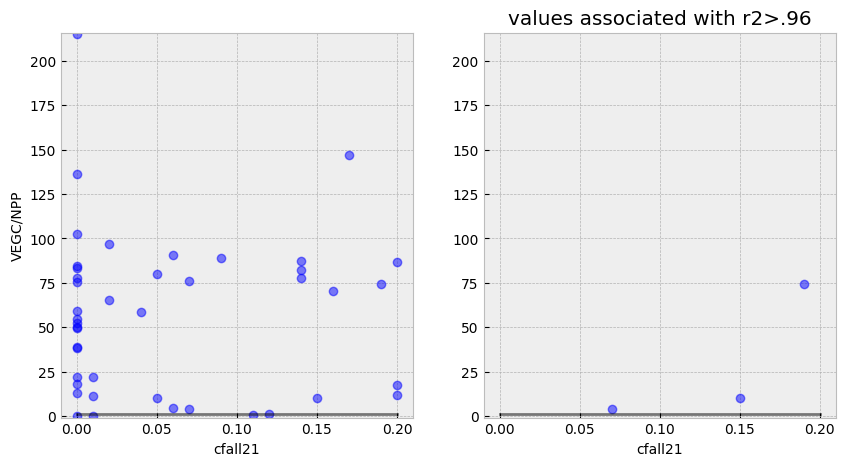

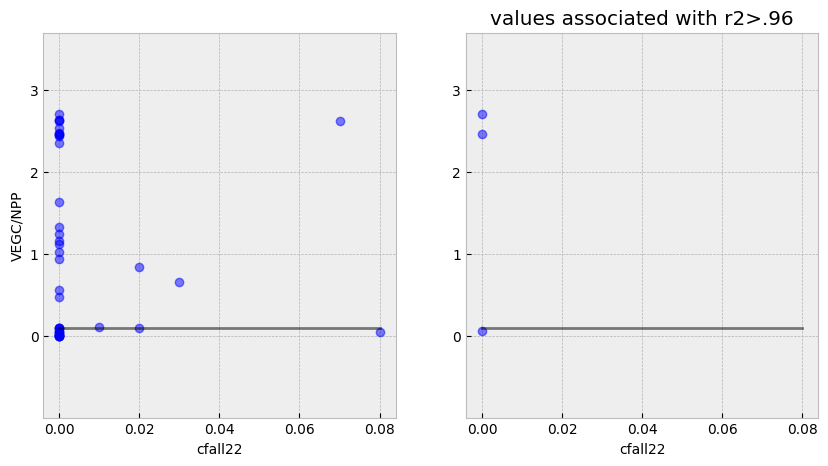

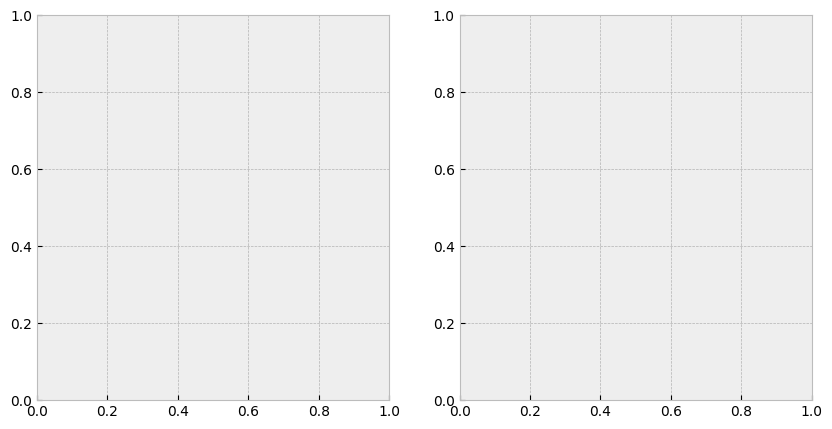

In [45]:
#this assumes a 1-1 relationship between obs and params
i=0
for item in mparams:
    ut.plot_paramsvstarget(df_param,df_model,r2,i,xlabel=item,ylabel='VEGC/NPP')
    i=i+1